In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from ccf_utils import CCF, CCFMesh
import trimesh

%matplotlib inline
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", font_scale=0.8, rc=custom_params)
%config InlineBackend.figure_format='retina'

%load_ext autoreload
%autoreload 2

In [2]:
# get region ids in the CCF (used to get the correct mesh object from /data/ccf_2017_obj/)
ccf = CCF()
regions = ["root", "LC"]
region_list = [(k, v) for k, v in ccf.acronymMap.items() if v in regions]
region_idx = [id[0] for id in region_list]
print(region_list)

[(997, 'root'), (147, 'LC')]


In [3]:
# manually specify KDE mesh regions and colors
data = {"idx": [997, 147], "region": ["root", "LC"], "color": ["#4d3d3d", "#DAA520"]}
df_ccf = pd.DataFrame(data)
display(df_ccf)

,idx,region,color
0,997,root,#4d3d3d
1,147,LC,#DAA520


In [4]:
def load_obj_mesh(path, scale=None):
    mesh = trimesh.load(path, force='mesh')
    if scale is not None:
        mesh.apply_scale(scale)
    return mesh

In [5]:
import os

# Define the color scale and reverse it
color_scale = [
    "#440154", "#482777", "#3e4a89", "#31688e", "#26828e", 
    "#1f9e89", "#35b779", "#6ece58", "#f1f512"
][::-1]  # Reverse the list

# Directory where the .obj files are stored
directory = "/root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/"

# Generate custom object regions dynamically
custom_obj_regions = {}

# Loop through percentiles (10, 20, ..., 90) and assign corresponding colors
# Add percentile meshes
for percentile in range(10, 100, 10):
    obj_file = f"percentile_{percentile}.obj"
    if os.path.isfile(os.path.join(directory, obj_file)):
        color = color_scale[(percentile // 10) - 1]
        custom_obj_regions[f"percentile_{percentile}"] = {
            "path": os.path.join(directory, obj_file),
            "color": color,
            "swap_axes": True
        }

# Optional: print to verify
for region, details in custom_obj_regions.items():
    print(f"{region}: {details['color']} -> {details['path']}")

percentile_10: #f1f512 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_10.obj
percentile_20: #6ece58 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_20.obj
percentile_30: #35b779 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_30.obj
percentile_40: #1f9e89 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_40.obj
percentile_50: #26828e -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_50.obj
percentile_60: #31688e -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_60.obj
percentile_70: #3e4a89 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_70.obj
percentile_80: #482777 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_80.obj
percentile_90: #440154 -> /root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/percentile_90.obj


In [6]:
# Also load the new custom LC mesh
custom_obj_regions["percentile_67"] = {
    "path": "/root/capsule/data/LC_percentile_meshes_2026-07-10_21-13-43/core_mesh.obj",
    "color": "#D3D3D3", # Light grey
    "swap_axes": True
}

In [7]:
# read in csv file containing cell coordinates for retrogradely labelled experiments
retro_cells = pd.read_csv("/results/FINAL_manual_proofread_ccf_37brains.csv")

# Filter out thalamic cells given they might be a mixture of TH and CTX projecting neurons
print(retro_cells.shape)
retro_cells = retro_cells[retro_cells["injection_region"] != "TH"]
print(retro_cells.shape)

# rename x, y, z columns to their corresponding ccf dimentions RC, DV, ML
retro_cells = retro_cells.rename(columns={"x": "ML", "y": "DV", "z": "RC"})

# define color codes for each ROI
cols_hex = ["#3D039B", "#6200A6", "#BF3982", "#D5536D", "#E76E5A", "#FBD124"]
region_col_map = dict(zip(["MOB", "CTX", "iontoTH", "PAG", "CB", "SP"], cols_hex))

# Add a color column based on injection_region
retro_cells["injection_region_color"] = retro_cells["injection_region"].map(region_col_map)
display(retro_cells.head(5))

(15876, 7)
(13665, 7)


,brain,channel,injection_region,ML,DV,RC,batch,injection_region_color
0,746046,561,CTX,261.107793,160.238174,426.496406,final,#6200A6
1,746046,561,CTX,260.630957,162.411807,426.451992,final,#6200A6
2,746046,561,CTX,260.420586,163.047178,426.273359,final,#6200A6
3,746046,561,CTX,258.255762,168.814883,424.967266,final,#6200A6
4,746046,561,CTX,254.746953,170.891426,423.269844,final,#6200A6


In [8]:
import time

def plot_brain_meshes(
    df_ccf,
    ccf,
    custom_obj_regions=None,
    df_points=None,
    plot_points=False,
    custom_mesh_in_microns=True,
    color_col=None,
    possible_color_cols=None,
    boolean_color_map=None,
    points_are_scaled=False,
    point_size=50,
    output_dir=None,
    filename_prefix="interactive_3Dplot_mesh" 
):
    import numpy as np
    import k3d

    t0 = time.time()
    print(f"[{time.strftime('%H:%M:%S')}] Initializing k3d plot...")
    plot = k3d.plot(camera_zoom_speed=10, camera_fov=30.0)
    print(f"[{time.strftime('%H:%M:%S')}] k3d plot initialized in {time.time() - t0:.2f} s")

    # === Plot region meshes from CCF ===
    t1 = time.time()
    for idx, region, color in zip(df_ccf["idx"], df_ccf["region"], df_ccf["color"]):
        print(f"[{time.strftime('%H:%M:%S')}] Plotting mesh for region: {region}")
        t_mesh = time.time()
        if custom_obj_regions and region in custom_obj_regions:
            print(f"[{time.strftime('%H:%M:%S')}] Using custom mesh for region: {region}")
            scale = None if custom_mesh_in_microns else ccf.resolution
            mesh = load_obj_mesh(custom_obj_regions[region]["path"], scale=scale)
            vertices = mesh.vertices
            indices = mesh.faces
            normals = mesh.vertex_normals
            print(f"[{time.strftime('%H:%M:%S')}] Loaded OBJ mesh for {region}: {len(vertices)} vertices, {len(indices)} faces")
        else:
            vertices, normals, indices = CCFMesh.get_mesh_from_id(idx)
            vertices *= ccf.resolution
            print(f"[{time.strftime('%H:%M:%S')}] Loaded CCF mesh for {region}: {len(vertices)} vertices, {len(indices)} faces")

        vertices = np.array(vertices, dtype=np.float32)
        indices = np.array(indices, dtype=np.uint32)
        normals = np.array(normals, dtype=np.float32)

        col = int(color.replace("#", "0x"), 16)
        plt_mesh = k3d.mesh(
            vertices=vertices,
            indices=indices,
            normals=normals,
            color=col,
            wireframe=False,
            opacity=0.1,
            name=region
        )
        plot += plt_mesh
        print(f"[{time.strftime('%H:%M:%S')}] Mesh for {region} plotted in {time.time() - t_mesh:.2f} s")
    print(f"[{time.strftime('%H:%M:%S')}] All region meshes plotted in {time.time() - t1:.2f} s")

    # === Plot any custom meshes not already included in df_ccf ===
    t2 = time.time()
    if custom_obj_regions:
        plotted_regions = set(df_ccf["region"])
        for region in sorted(custom_obj_regions.keys(), reverse=True, key=lambda x: int(x.split('_')[-1])):
            if region not in plotted_regions:
                print(f"[{time.strftime('%H:%M:%S')}] Plotting custom-only region: {region}")
                t_custom = time.time()
                scale = None if custom_mesh_in_microns else ccf.resolution
                obj_info = custom_obj_regions[region]
                mesh = load_obj_mesh(obj_info["path"], scale=scale)
                if obj_info.get("swap_axes", False):
                    vertices = mesh.vertices[:, [1,2,0]]
                else:
                    vertices = mesh.vertices
                indices = mesh.faces
                normals = mesh.vertex_normals

                # Mirror across y=5700 (z axis after swap)
                vertices_mirror = vertices.copy()
                vertices_mirror[:, 2] = 2 * 5700 - vertices_mirror[:, 2]
                normals_mirror = normals.copy()
                normals_mirror[:, 2] *= -1

                # Combine original and mirrored mesh
                vertices_combined = np.vstack([vertices, vertices_mirror])
                normals_combined = np.vstack([normals, normals_mirror])
                indices_combined = np.vstack([
                    indices,
                    indices + len(vertices)  # Offset indices for mirrored mesh
                ])

                color = obj_info.get("color", "#cccccc")
                col = int(color.replace("#", "0x"), 16)
                opacity_val = 0.1

                plt_mesh = k3d.mesh(
                    vertices=vertices_combined,
                    indices=indices_combined,
                    normals=normals_combined,
                    color=col,
                    wireframe=False,
                    opacity=opacity_val,
                    name=region + "_with_mirror"
                )
                plot += plt_mesh
                print(f"[{time.strftime('%H:%M:%S')}] Custom-only region {region} plotted in {time.time() - t_custom:.2f} s")
    print(f"[{time.strftime('%H:%M:%S')}] All custom-only meshes plotted in {time.time() - t2:.2f} s")

    # === Plot points  ===
    t4 = time.time()
    if plot_points and df_points is not None:
        print(f"[{time.strftime('%H:%M:%S')}] Preparing to plot points...")

        if boolean_color_map:
            for label, color in boolean_color_map.items():
                if label not in df_points.columns:
                    print(f"[{time.strftime('%H:%M:%S')}] Warning: Column '{label}' not in DataFrame, skipping...")
                    continue
                subset = df_points[df_points[label]]
                if subset.empty:
                    print(f"[{time.strftime('%H:%M:%S')}] No cells found for group: {label}")
                    continue
                print(f"[{time.strftime('%H:%M:%S')}] Plotting {len(subset)} points for group: {label} with color {color}")
                pos = subset[["RC", "DV", "ML"]].values.astype(np.float32)
                if not points_are_scaled:
                    pos *= ccf.resolution
                try:
                    color_int = int(color.replace("#", ""), 16)
                except Exception:
                    color_int = 0xFF0000  # fallback to red
                cols = np.array([color_int] * len(subset), dtype=np.uint32)
                plt_points = k3d.points(
                    positions=pos,
                    point_size=point_size,
                    shader="3d",
                    colors=cols,
                    opacity=0.8,
                    name=label
                )
                plot += plt_points

        else:
            chosen_color_col = None
            if color_col is not None and color_col in df_points.columns:
                chosen_color_col = color_col
            elif possible_color_cols is not None:
                chosen_color_col = next((col for col in possible_color_cols if col in df_points.columns), None)
            else:
                chosen_color_col = (
                    "cell_color" if "cell_color" in df_points.columns else
                    ("injection_region_color" if "injection_region_color" in df_points.columns else None)
                )

            if chosen_color_col:
                grouped = df_points.groupby(chosen_color_col)
                for color, group in grouped:
                    print(f"[{time.strftime('%H:%M:%S')}] Plotting {len(group)} points for color {color}...")
                    pos = group[["RC", "DV", "ML"]].values.astype(np.float32)
                    if not points_are_scaled:
                        pos *= ccf.resolution
                    try:
                        color_int = int(color.replace("#", ""), 16)
                    except Exception:
                        color_int = 0xFF0000
                    cols = np.array([color_int] * len(group), dtype=np.uint32)
                    name = group["injection_region"].iloc[0] if "injection_region" in group.columns else str(color)
                    plt_points = k3d.points(
                        positions=pos,
                        point_size=point_size,
                        shader="3d",
                        colors=cols,
                        opacity=0.8,
                        name=name
                    )
                    plot += plt_points
            else:
                print(f"[{time.strftime('%H:%M:%S')}] Plotting all points in red...")
                pos = df_points[["RC", "DV", "ML"]].values.astype(np.float32)
                if not points_are_scaled:
                    pos *= ccf.resolution
                cols = np.array([0xFF0000] * len(df_points), dtype=np.uint32)
                plt_points = k3d.points(
                    positions=pos,
                    point_size=point_size,
                    shader="3d",
                    colors=cols,
                    opacity=0.8,
                    name="cells"
                )
                plot += plt_points

    print(f"[{time.strftime('%H:%M:%S')}] Points plotted in {time.time() - t4:.2f} s")

    t5 = time.time()
    print(f"[{time.strftime('%H:%M:%S')}] Displaying plot...")
    plot.display()
    print(f"[{time.strftime('%H:%M:%S')}] Plot displayed in {time.time() - t5:.2f} s")
    
    # === Export plot to HTML ===
    if output_dir:
        from pathlib import Path
        output_path = Path(output_dir)
        output_path.mkdir(parents=True, exist_ok=True)
        
        t_export = time.time()
        print(f"[{time.strftime('%H:%M:%S')}] Exporting plot...")
        
        # Export HTML (k3d plot as interactive widget)
        try:
            html_file = output_path / f"{filename_prefix}_interactive.html"
            from ipywidgets import embed
            embed.embed_minimal_html(
                str(html_file),
                views=[plot],
                title=f"{filename_prefix} Brain Mesh Visualization"
            )
            print(f"[{time.strftime('%H:%M:%S')}] Interactive HTML saved to: {html_file}")
        except Exception as e:
            print(f"[{time.strftime('%H:%M:%S')}] Warning: Could not save interactive HTML: {e}")
        
        print(f"[{time.strftime('%H:%M:%S')}] Export completed in {time.time() - t_export:.2f} s")
    
    print(f"[{time.strftime('%H:%M:%S')}] Total time: {time.time() - t0:.2f} s")

In [9]:
# Plot just masks
plot_brain_meshes(
    df_ccf=df_ccf,
    ccf=ccf,
    custom_obj_regions=custom_obj_regions,
    df_points=None,
    plot_points=False,
    custom_mesh_in_microns=True,
    output_dir="/results/plots",
    filename_prefix="H2B-GFP_centile_meshes"
)

[00:19:31] Initializing k3d plot...
[00:19:31] k3d plot initialized in 0.00 s
[00:19:31] Plotting mesh for region: root


[00:19:32] Loaded CCF mesh for root: 1233100 vertices, 98638 faces
[00:19:32] Mesh for root plotted in 0.87 s
[00:19:32] Plotting mesh for region: LC
[00:19:32] Loaded CCF mesh for LC: 1550 vertices, 114 faces
[00:19:32] Mesh for LC plotted in 0.01 s
[00:19:32] All region meshes plotted in 0.88 s
[00:19:32] Plotting custom-only region: percentile_90


/opt/conda/lib/python3.10/site-packages/traittypes/traittypes.py:98: UserWarning: Given trait value dtype "float64" does not match required type "float32". A coerced copy has been created.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/traittypes/traittypes.py:98: UserWarning: Given trait value dtype "int64" does not match required type "uint32". A coerced copy has been created.
  warnings.warn(


[00:19:33] Custom-only region percentile_90 plotted in 0.90 s
[00:19:33] Plotting custom-only region: percentile_80
[00:19:34] Custom-only region percentile_80 plotted in 0.42 s
[00:19:34] Plotting custom-only region: percentile_70
[00:19:34] Custom-only region percentile_70 plotted in 0.90 s
[00:19:34] Plotting custom-only region: percentile_67
[00:19:35] Custom-only region percentile_67 plotted in 0.28 s
[00:19:35] Plotting custom-only region: percentile_60
[00:19:35] Custom-only region percentile_60 plotted in 0.34 s
[00:19:35] Plotting custom-only region: percentile_50
[00:19:35] Custom-only region percentile_50 plotted in 0.36 s
[00:19:35] Plotting custom-only region: percentile_40
[00:19:36] Custom-only region percentile_40 plotted in 0.30 s
[00:19:36] Plotting custom-only region: percentile_30
[00:19:36] Custom-only region percentile_30 plotted in 0.25 s
[00:19:36] Plotting custom-only region: percentile_20
[00:19:36] Custom-only region percentile_20 plotted in 0.24 s
[00:19:36]

Output()

[00:19:37] Plot displayed in 0.01 s
[00:19:37] Exporting plot...
[00:19:37] Interactive HTML saved to: /results/plots/H2B-GFP_centile_meshes_interactive.html
[00:19:37] Export completed in 0.58 s
[00:19:37] Total time: 5.77 s


In [10]:
# Plot masks and retrograde labelled cells
plot_brain_meshes(
    df_ccf=df_ccf,
    ccf=ccf,
    custom_obj_regions=custom_obj_regions,
    df_points=retro_cells,
    plot_points=True,
    custom_mesh_in_microns=True,
    output_dir="/results/plots",
    filename_prefix="H2B-GFP_centile_meshes_retrograde_cells"
    # boolean_color_map=None (default)
    # points_are_scaled=False (default)
    # point_size=50 (default)
)

[00:20:17] Initializing k3d plot...
[00:20:17] k3d plot initialized in 0.00 s
[00:20:17] Plotting mesh for region: root
[00:20:18] Loaded CCF mesh for root: 1233100 vertices, 98638 faces
[00:20:18] Mesh for root plotted in 0.85 s
[00:20:18] Plotting mesh for region: LC
[00:20:18] Loaded CCF mesh for LC: 1550 vertices, 114 faces
[00:20:18] Mesh for LC plotted in 0.00 s
[00:20:18] All region meshes plotted in 0.86 s
[00:20:18] Plotting custom-only region: percentile_90
[00:20:19] Custom-only region percentile_90 plotted in 0.41 s
[00:20:19] Plotting custom-only region: percentile_80
[00:20:19] Custom-only region percentile_80 plotted in 0.33 s
[00:20:19] Plotting custom-only region: percentile_70
[00:20:19] Custom-only region percentile_70 plotted in 0.58 s
[00:20:19] Plotting custom-only region: percentile_67
[00:20:20] Custom-only region percentile_67 plotted in 0.20 s
[00:20:20] Plotting custom-only region: percentile_60
[00:20:20] Custom-only region percentile_60 plotted in 0.21 s
[0

Output()

[00:20:21] Plot displayed in 0.01 s
[00:20:21] Exporting plot...
[00:20:22] Interactive HTML saved to: /results/plots/H2B-GFP_centile_meshes_retrograde_cells_interactive.html
[00:20:22] Export completed in 1.13 s
[00:20:22] Total time: 4.83 s


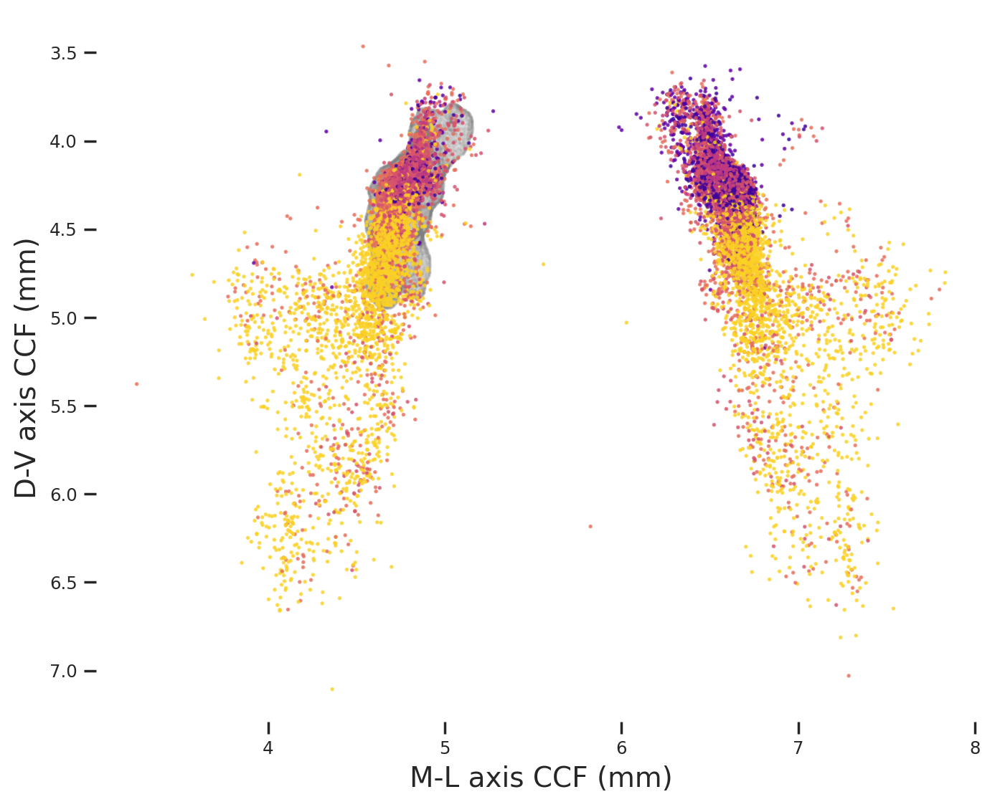

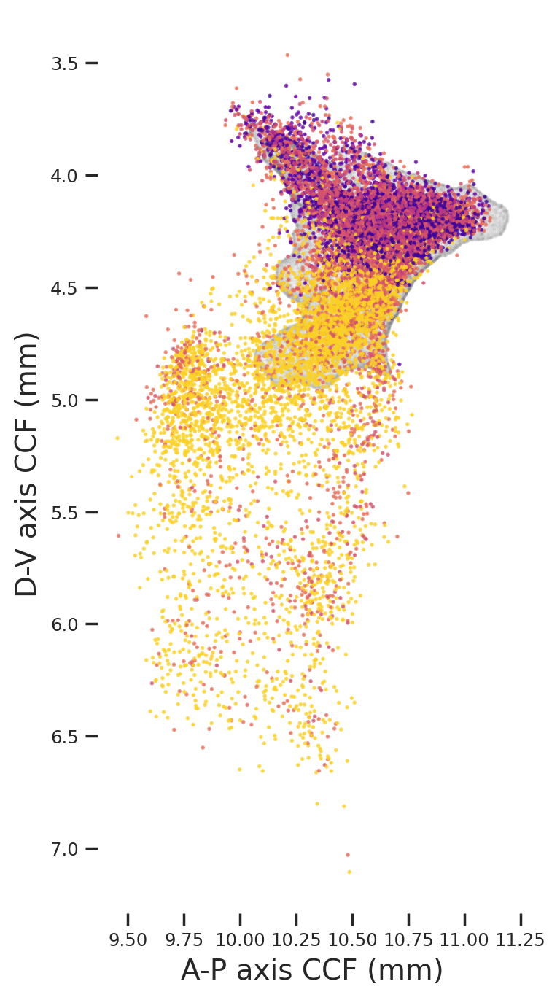

In [11]:
# --- Load mesh with correct orientation ---
mesh_path = custom_obj_regions["percentile_67"]["path"]
mesh = trimesh.load(mesh_path, force='mesh')
if custom_obj_regions["percentile_67"].get("swap_axes", False):
    mesh_vertices = mesh.vertices[:, [1, 2, 0]]
else:
    mesh_vertices = mesh.vertices

mesh_alpha = 0.1
dot_size = 0.2

# --- Convert retro_cells from voxel to micron space ---
ccf_res = 25  # 25 μm per voxel
retro_pts_um = retro_cells[["RC", "DV", "ML"]].values * ccf_res

# --- Assign colors using injection_region_color ---
proj_colors = retro_cells["injection_region_color"].fillna("#cccccc").tolist()

# --- Extract coordinates for plotting ---
mesh_vertices_mm = mesh_vertices / 1000.0
retro_pts_mm = retro_pts_um / 1000.0
mm_x, mm_y, mm_z = retro_pts_mm[:, 0], retro_pts_mm[:, 2], retro_pts_mm[:, 1]  # AP, ML, DV

# --- Coronal (ML vs DV) ---
fig_cor, ax_cor = plt.subplots(figsize=(8,8))
ax_cor.scatter(mesh_vertices_mm[:, 2], mesh_vertices_mm[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
ax_cor.scatter(mm_y, mm_z, c=proj_colors, s=1, alpha=0.7)
ax_cor.set_xlabel('M-L axis CCF (mm)', fontsize=14)
ax_cor.set_ylabel('D-V axis CCF (mm)', fontsize=14)
ax_cor.invert_yaxis()
ax_cor.set_aspect('equal')
ax_cor.set_frame_on(False)
plt.show()

# --- Sagittal (AP vs DV) ---
fig_sag, ax_sag = plt.subplots(figsize=(8, 8))
ax_sag.scatter(mesh_vertices_mm[:, 0], mesh_vertices_mm[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
ax_sag.scatter(mm_x, mm_z, c=proj_colors, s=1, alpha=0.7)
ax_sag.set_xlabel('A-P axis CCF (mm)', fontsize=14)
ax_sag.set_ylabel('D-V axis CCF (mm)', fontsize=14)
ax_sag.invert_yaxis()
#ax_sag.invert_xaxis()
ax_sag.set_aspect('equal')
ax_sag.set_frame_on(False)
plt.show()

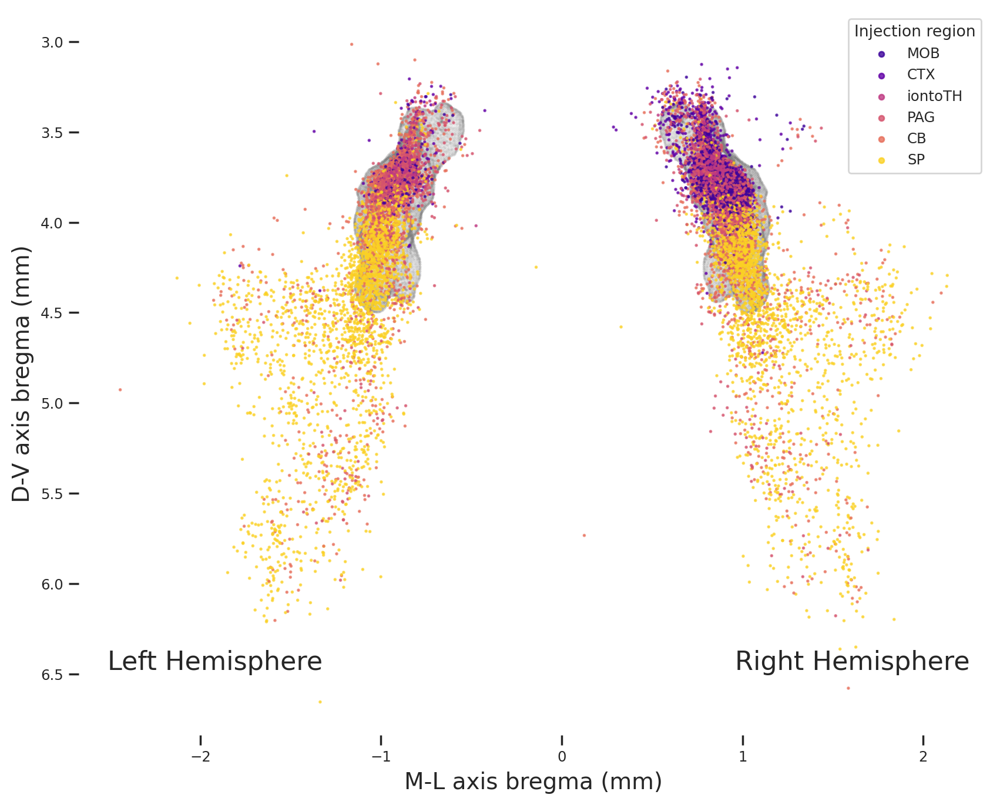

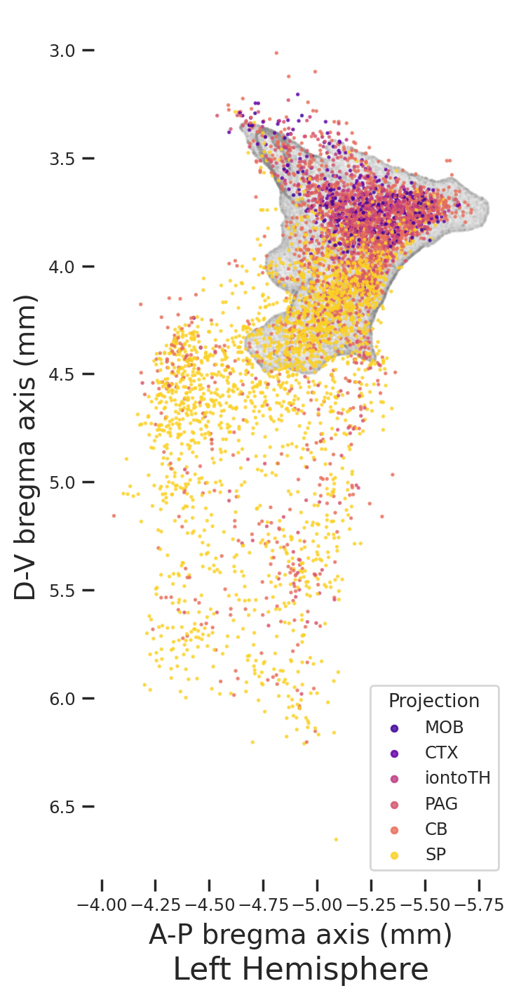

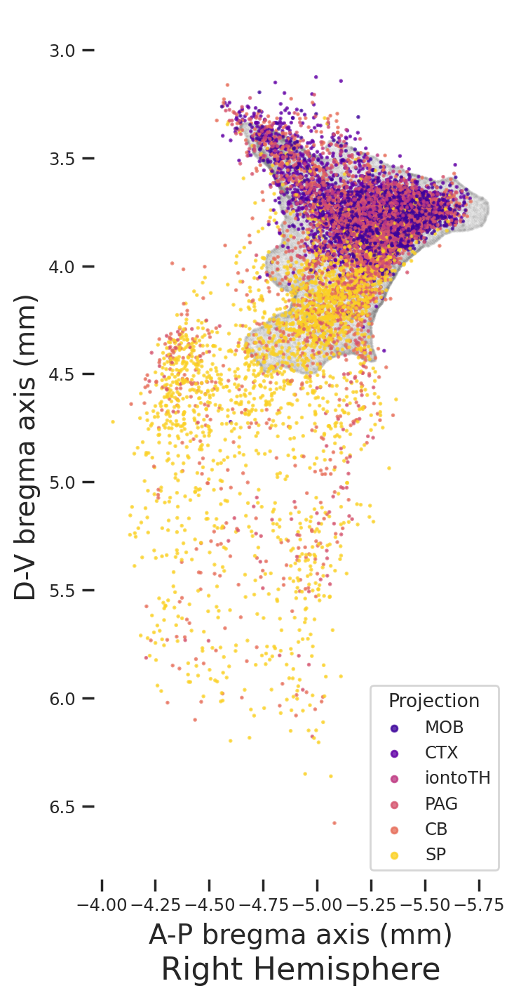

In [12]:
# --- Set bregma in microns for 25um CCF ---
bregma_um = np.array([216, 18, 228]) * 25  # [5400, 450, 5700] μm

# --- Mesh: subtract bregma ---
mesh_vertices_bregma_um = mesh_vertices - bregma_um
mesh_vertices_bregma_um[:, 0] = -mesh_vertices_bregma_um[:, 0]  # Flip AP
mesh_vertices_bregma_um[:, 2] = -np.abs(mesh_vertices_bregma_um[:, 2])  # Mirror ML to left if desired

# --- retro_cells: convert to micron, subtract bregma ---
retro_pts_um = retro_cells[["RC", "DV", "ML"]].values * ccf_res
retro_pts_bregma_um = retro_pts_um - bregma_um
retro_pts_bregma_um[:, 0] = -retro_pts_bregma_um[:, 0]  # Flip AP

# --- Assign colors using injection_region_color ---
proj_colors = retro_cells["injection_region_color"].fillna("#cccccc").tolist()


# --- Extract coordinates for plotting (in mm) ---
mesh_vertices_bregma_mm = mesh_vertices_bregma_um / 1000.0
retro_pts_bregma_mm = retro_pts_bregma_um / 1000.0
mm_x, mm_y, mm_z = retro_pts_bregma_mm[:, 0], retro_pts_bregma_mm[:, 2], retro_pts_bregma_mm[:, 1]  # AP, ML, DV

# --- Create hemisphere masks based on ML coordinates ---
left_hemisphere_mask = mm_y <= 0  # Left hemisphere: ML <= 0
right_hemisphere_mask = mm_y > 0   # Right hemisphere: ML > 0

# --- Coronal (ML vs DV) ---
fig_cor, ax_cor = plt.subplots(figsize=(12, 8))  # Wider to accommodate both hemispheres
ax_cor.scatter(mesh_vertices_bregma_mm[:, 2], mesh_vertices_bregma_mm[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
# Plot mirrored mesh (flip ML)
mesh_vertices_bregma_mm_mirror = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_mirror[:, 2] *= -1
ax_cor.scatter(mesh_vertices_bregma_mm_mirror[:, 2], mesh_vertices_bregma_mm_mirror[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
for region, color in region_col_map.items():
    mask = retro_cells["injection_region"] == region
    ax_cor.scatter([], [], c=color, s=10, alpha=0.8, label=region)
ax_cor.scatter(mm_y, mm_z, c=proj_colors, s=1, alpha=0.7)

# Add hemisphere labels positioned relative to the actual data range
y_range = ax_cor.get_ylim()
x_range = ax_cor.get_xlim()
label_y = y_range[0] + 0.9 * (y_range[1] - y_range[0])  # Near bottom of plot
left_x = x_range[0] + 0.15 * (x_range[1] - x_range[0])   # 15% from left edge
right_x = x_range[1] - 0.15 * (x_range[1] - x_range[0])  # 15% from right edge

ax_cor.text(left_x, label_y, 'Left Hemisphere', fontsize=16, ha='center', va='center')
ax_cor.text(right_x, label_y, 'Right Hemisphere', fontsize=16, ha='center', va='center')

ax_cor.set_xlabel('M-L axis bregma (mm)', fontsize=14)
ax_cor.set_ylabel('D-V axis bregma (mm)', fontsize=14)
ax_cor.invert_yaxis()
ax_cor.set_aspect('equal')
ax_cor.set_frame_on(False)
ax_cor.legend(title="Injection region", loc="best")
plt.savefig('/results/plots/all_retro_coronal_plot.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_coronal_plot.svg', format='svg', bbox_inches='tight')
plt.show()

# --- Calculate common axis limits for sagittal plots ---
# Combine mesh and all cell coordinates to get global limits
all_ap_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 0],  # mesh AP
    mm_x                            # all cells AP
])
all_dv_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 1],  # mesh DV
    mm_z                            # all cells DV
])

ap_min, ap_max = all_ap_coords.min(), all_ap_coords.max()
dv_min, dv_max = all_dv_coords.min(), all_dv_coords.max()

# Add margins
ap_margin = 0.05 * (ap_max - ap_min)
dv_margin = 0.05 * (dv_max - dv_min)
ap_limits = (ap_min - ap_margin, ap_max + ap_margin)
dv_limits = (dv_min - dv_margin, dv_max + dv_margin)

# --- Sagittal Left Hemisphere (AP vs DV) ---
fig_sag_left, ax_sag_left = plt.subplots(figsize=(8, 8))
ax_sag_left.scatter(mesh_vertices_bregma_mm[:, 0], mesh_vertices_bregma_mm[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
for region, color in region_col_map.items():
    mask = retro_cells["injection_region"] == region
    ax_sag_left.scatter([], [], c=color, s=10, alpha=0.8, label=region)
ax_sag_left.legend(title="Projection", loc="best")
# Plot only left hemisphere cells (ML <= 0)
left_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if left_hemisphere_mask[i]]
ax_sag_left.scatter(mm_x[left_hemisphere_mask], mm_z[left_hemisphere_mask], c=left_proj_colors, s=1, alpha=0.7)
ax_sag_left.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_sag_left.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_sag_left.set_title('Left Hemisphere', fontsize=16, y=-0.13)
ax_sag_left.set_xlim(ap_limits)
ax_sag_left.set_ylim(dv_limits)
ax_sag_left.invert_yaxis()
ax_sag_left.invert_xaxis()
ax_sag_left.set_aspect('equal')
ax_sag_left.set_frame_on(False)
plt.savefig('/results/plots/all_retro_sagittal_left_plot.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_left_plot.svg', format='svg', bbox_inches='tight')
plt.show()

# --- Sagittal Right Hemisphere (AP vs DV) ---
fig_sag_right, ax_sag_right = plt.subplots(figsize=(8, 8))
# Plot right hemisphere mesh (mirrored ML coordinates)
mesh_vertices_bregma_mm_right = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_right[:, 2] *= -1  # Mirror ML for right hemisphere
ax_sag_right.scatter(mesh_vertices_bregma_mm_right[:, 0], mesh_vertices_bregma_mm_right[:, 1], color='gray', s=dot_size, alpha=mesh_alpha)
for region, color in region_col_map.items():
    mask = retro_cells["injection_region"] == region
    ax_sag_right.scatter([], [], c=color, s=10, alpha=0.8, label=region)
ax_sag_right.legend(title="Projection", loc="best")
# Plot only right hemisphere cells (ML > 0)
right_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if right_hemisphere_mask[i]]
ax_sag_right.scatter(mm_x[right_hemisphere_mask], mm_z[right_hemisphere_mask], c=right_proj_colors, s=1, alpha=0.7)
ax_sag_right.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_sag_right.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_sag_right.set_title('Right Hemisphere', fontsize=16, y=-0.13)
ax_sag_right.set_xlim(ap_limits)
ax_sag_right.set_ylim(dv_limits)
ax_sag_right.invert_yaxis()
ax_sag_right.invert_xaxis()
ax_sag_right.set_aspect('equal')
ax_sag_right.set_frame_on(False)
plt.savefig('/results/plots/all_retro_sagittal_right_plot.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_right_plot.svg', format='svg', bbox_inches='tight')
plt.show()

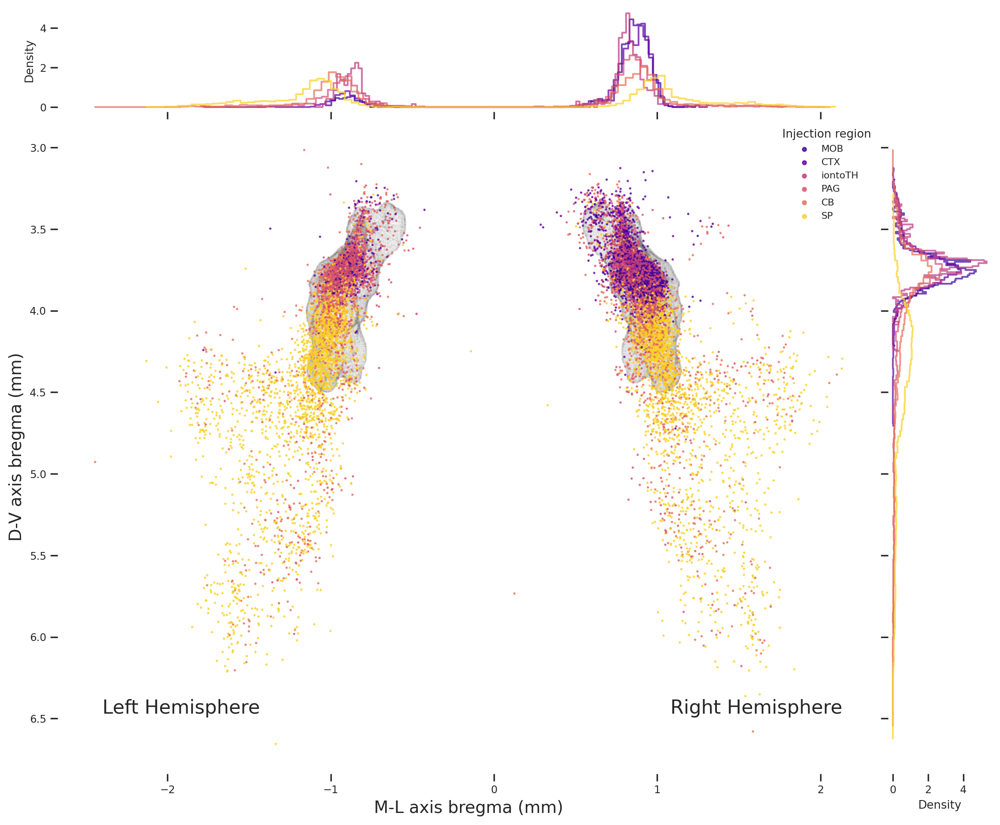

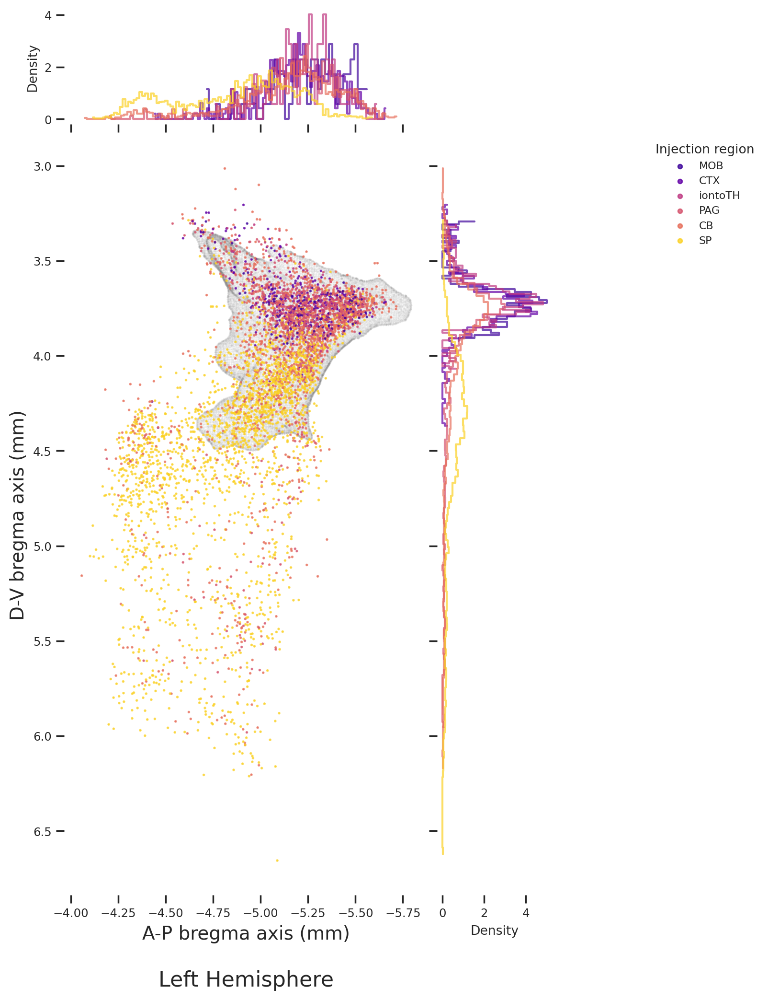

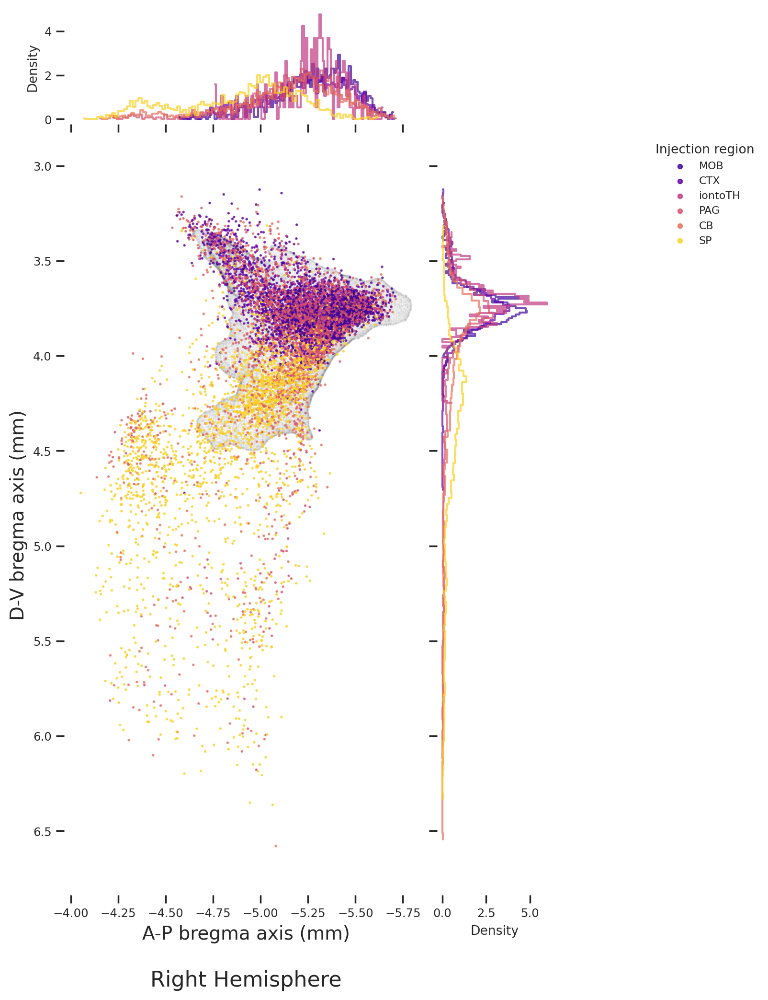

In [13]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Coronal (ML vs DV) with marginal histograms ---
fig_cor = plt.figure(figsize=(14, 12))  # Wider to match the non-histogram version
ax_main = fig_cor.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: mesh scatter
ax_main.scatter(mesh_vertices_bregma_mm[:, 2], mesh_vertices_bregma_mm[:, 1], 
                color='gray', s=dot_size, alpha=mesh_alpha)

# Plot mirrored mesh (flip ML)
mesh_vertices_bregma_mm_mirror = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_mirror[:, 2] *= -1
ax_main.scatter(mesh_vertices_bregma_mm_mirror[:, 2], mesh_vertices_bregma_mm_mirror[:, 1], 
                color='gray', s=dot_size, alpha=mesh_alpha)

# Main plot: retro cells scatter
ax_main.scatter(mm_y, mm_z, c=proj_colors, s=1, alpha=0.7)

# Add hemisphere labels positioned relative to the actual data range
y_range = ax_main.get_ylim()
x_range = ax_main.get_xlim()
label_y = y_range[0] + 0.9 * (y_range[1] - y_range[0])  # Near bottom of plot
left_x = x_range[0] + 0.15 * (x_range[1] - x_range[0])   # 15% from left edge
right_x = x_range[1] - 0.15 * (x_range[1] - x_range[0])  # 15% from right edge

ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=16, ha='center', va='center')
ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=16, ha='center', va='center')

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region
for region, color in region_col_map.items():
    mask = retro_cells["injection_region"] == region
    if mask.any():
        region_y = mm_y[mask]  # ML coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (ML distribution)
        if len(region_y) > 5:
            bins_x = min(100, max(5, len(region_y) // 2))
            hist_x, bin_edges_x = np.histogram(region_y, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('M-L axis bregma (mm)', fontsize=14)
ax_main.set_ylabel('D-V axis bregma (mm)', fontsize=14)
ax_main.invert_yaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="best", fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_coronal_plot_with_histograms.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_coronal_plot_with_histograms.svg', format='svg', bbox_inches='tight')

plt.show()

# --- Calculate common axis limits for sagittal plots ---
# Combine mesh and all cell coordinates to get global limits
all_ap_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 0],  # mesh AP
    mm_x                            # all cells AP
])
all_dv_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 1],  # mesh DV
    mm_z                            # all cells DV
])

ap_min, ap_max = all_ap_coords.min(), all_ap_coords.max()
dv_min, dv_max = all_dv_coords.min(), all_dv_coords.max()

# Add margins
ap_margin = 0.05 * (ap_max - ap_min)
dv_margin = 0.05 * (dv_max - dv_min)
ap_limits = (ap_min - ap_margin, ap_max + ap_margin)
dv_limits = (dv_min - dv_margin, dv_max + dv_margin)

# --- Sagittal Left Hemisphere (AP vs DV) with marginal histograms ---
fig_sag_left = plt.figure(figsize=(12, 12))
ax_main = fig_sag_left.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: mesh scatter
ax_main.scatter(mesh_vertices_bregma_mm[:, 0], mesh_vertices_bregma_mm[:, 1], 
                color='gray', s=dot_size, alpha=mesh_alpha)

# Plot only left hemisphere cells (ML <= 0)
left_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if left_hemisphere_mask[i]]
ax_main.scatter(mm_x[left_hemisphere_mask], mm_z[left_hemisphere_mask], c=left_proj_colors, s=1, alpha=0.7)

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region (left hemisphere only)
for region, color in region_col_map.items():
    mask = (retro_cells["injection_region"] == region) & left_hemisphere_mask
    if mask.any():
        region_x = mm_x[mask]  # AP coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (AP distribution)
        if len(region_x) > 5:
            bins_x = min(100, max(5, len(region_x) // 2))
            hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Left Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits)
ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis()
ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_sagittal_left_plot_with_histograms.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_left_plot_with_histograms.svg', format='svg', bbox_inches='tight')

plt.show()

# --- Sagittal Right Hemisphere (AP vs DV) with marginal histograms ---
fig_sag_right = plt.figure(figsize=(12, 12))
ax_main = fig_sag_right.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: right hemisphere mesh scatter (mirrored ML coordinates)
mesh_vertices_bregma_mm_right = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_right[:, 2] *= -1  # Mirror ML for right hemisphere
ax_main.scatter(mesh_vertices_bregma_mm_right[:, 0], mesh_vertices_bregma_mm_right[:, 1], 
                color='gray', s=dot_size, alpha=mesh_alpha)

# Plot only right hemisphere cells (ML > 0)
right_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if right_hemisphere_mask[i]]
ax_main.scatter(mm_x[right_hemisphere_mask], mm_z[right_hemisphere_mask], c=right_proj_colors, s=1, alpha=0.7)

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region (right hemisphere only)
for region, color in region_col_map.items():
    mask = (retro_cells["injection_region"] == region) & right_hemisphere_mask
    if mask.any():
        region_x = mm_x[mask]  # AP coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (AP distribution)
        if len(region_x) > 5:
            bins_x = min(100, max(5, len(region_x) // 2))
            hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Right Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits)
ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis()
ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_sagittal_right_plot_with_histograms.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_right_plot_with_histograms.svg', format='svg', bbox_inches='tight')

plt.show()

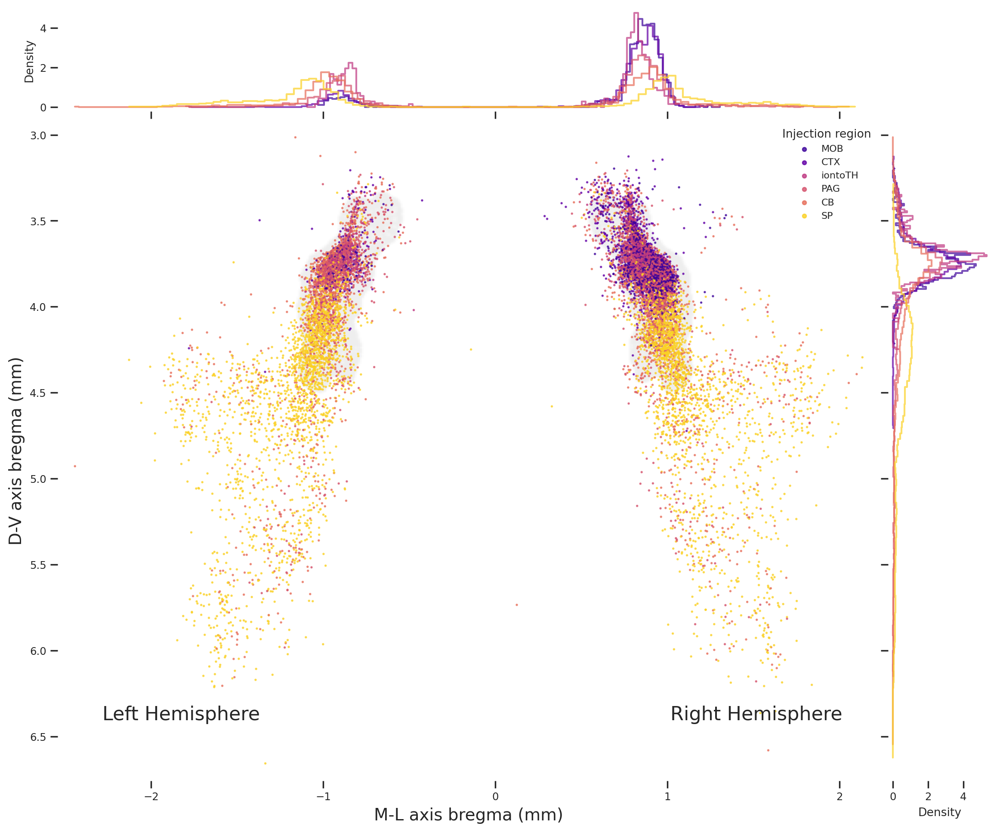

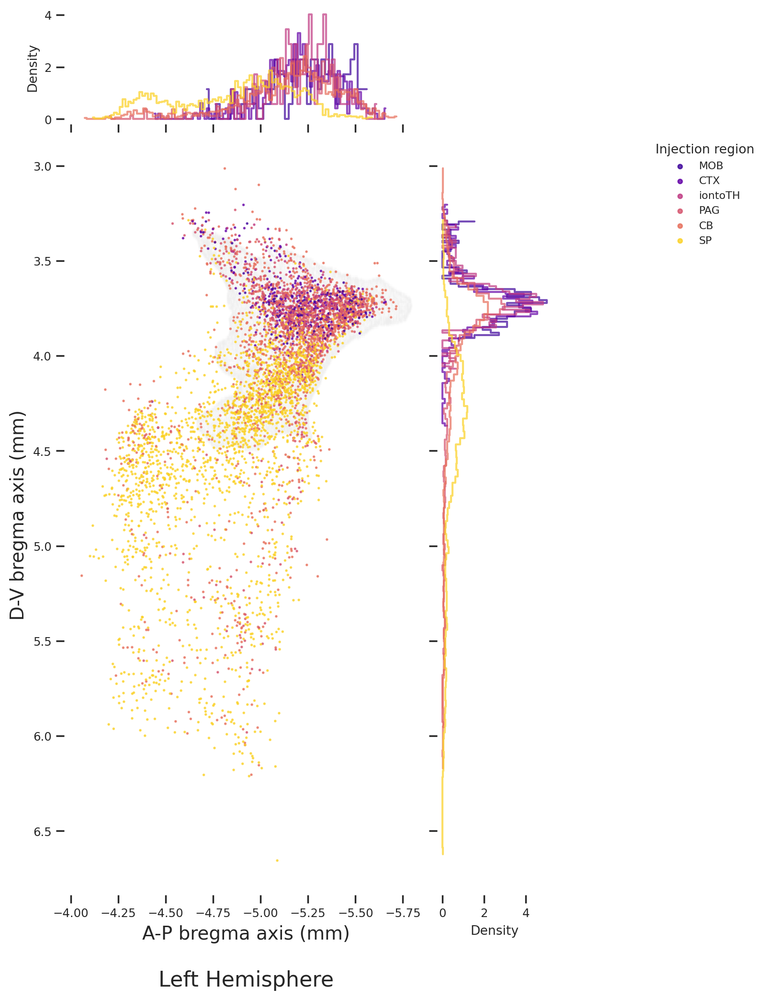

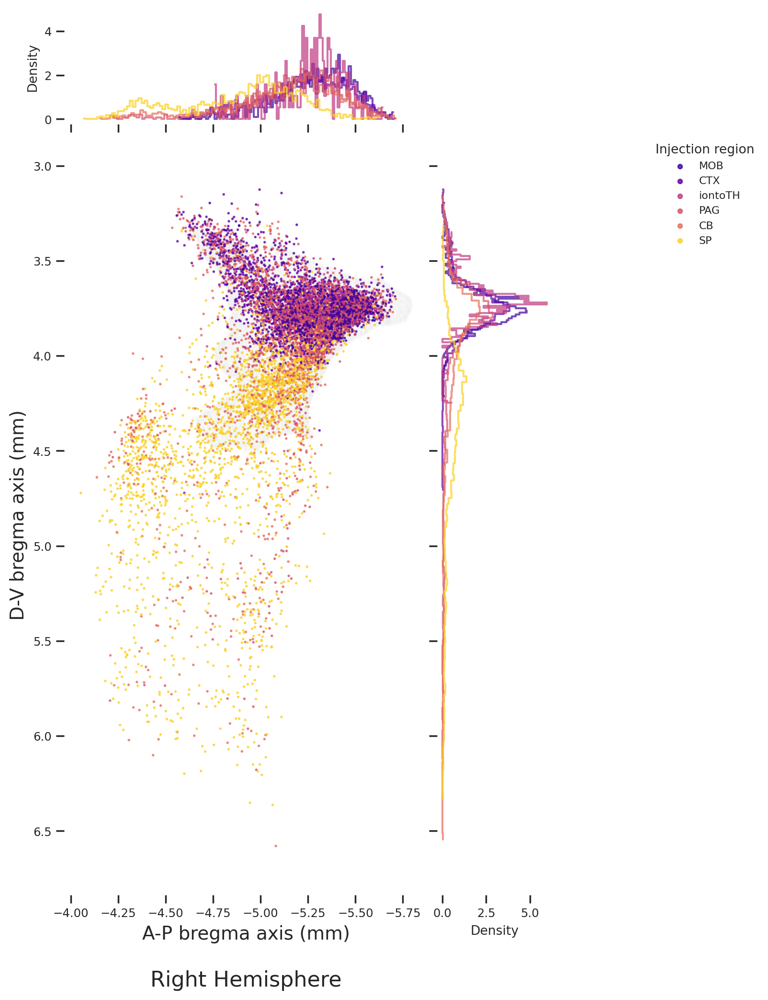

In [14]:
# Helper function for bitmap mesh
def create_mesh_bitmap(mesh_x, mesh_y, x_lim, y_lim, resolution=500, alpha=mesh_alpha):
    from scipy.ndimage import gaussian_filter
    hist, x_edges, y_edges = np.histogram2d(
        mesh_x, mesh_y,
        bins=resolution,
        range=[x_lim, y_lim]
    )
    # Gaussian smoothing for antialiased, soft mesh edges
    binary_mask = (hist > 0).astype(float)
    alpha_channel = gaussian_filter(binary_mask, sigma=0.8)
    alpha_channel = np.clip(alpha_channel, 0, 1)
    bitmap = np.zeros((resolution, resolution, 4))
    bitmap[:, :, :3] = 0.35  # Gray RGB (darker)
    bitmap[:, :, 3] = alpha_channel.T * alpha
    return bitmap, [x_lim[0], x_lim[1], y_lim[0], y_lim[1]]

# --- Coronal (ML vs DV) with marginal histograms ---
# Set limits for coronal (ML vs DV)
ml_min, ml_max = mm_y.min() - 0.1, mm_y.max() + 0.1
dv_min, dv_max = mm_z.min() - 0.1, mm_z.max() + 0.1
ml_limits = (ml_min, ml_max)
dv_limits = (dv_min, dv_max)

# Create bitmaps for coronal
bitmap_mesh_orig, extent_orig = create_mesh_bitmap(
    mesh_vertices_bregma_mm[:, 2], mesh_vertices_bregma_mm[:, 1], ml_limits, dv_limits
)
mesh_vertices_bregma_mm_mirror = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_mirror[:, 2] *= -1
bitmap_mesh_mirr, extent_mirr = create_mesh_bitmap(
    mesh_vertices_bregma_mm_mirror[:, 2], mesh_vertices_bregma_mm_mirror[:, 1], ml_limits, dv_limits
)

fig_cor = plt.figure(figsize=(14, 12))  # Wider to match the non-histogram version
ax_main = fig_cor.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: REPLACE mesh scatter with bitmap imshow
ax_main.imshow(bitmap_mesh_orig, extent=extent_orig, origin='lower', aspect='equal', interpolation='nearest')
ax_main.imshow(bitmap_mesh_mirr, extent=extent_mirr, origin='lower', aspect='equal', interpolation='nearest')

# Main plot: retro cells scatter
ax_main.scatter(mm_y, mm_z, c=proj_colors, s=1, alpha=0.7)

# Add hemisphere labels positioned relative to the actual data range
y_range = ax_main.get_ylim()
x_range = ax_main.get_xlim()
label_y = y_range[0] + 0.9 * (y_range[1] - y_range[0])  # Near bottom of plot
left_x = x_range[0] + 0.15 * (x_range[1] - x_range[0])   # 15% from left edge
right_x = x_range[1] - 0.15 * (x_range[1] - x_range[0])  # 15% from right edge

ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=16, ha='center', va='center')
ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=16, ha='center', va='center')

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region
for region, color in region_col_map.items():
    mask = retro_cells["injection_region"] == region
    if mask.any():
        region_y = mm_y[mask]  # ML coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (ML distribution)
        if len(region_y) > 5:
            bins_x = min(100, max(5, len(region_y) // 2))
            hist_x, bin_edges_x = np.histogram(region_y, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('M-L axis bregma (mm)', fontsize=14)
ax_main.set_ylabel('D-V axis bregma (mm)', fontsize=14)
ax_main.invert_yaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="best", fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_coronal_plot_with_histograms_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_coronal_plot_with_histograms_bitmap_mesh.svg', format='svg', bbox_inches='tight')

plt.show()

# --- Calculate common axis limits for sagittal plots ---
# Combine mesh and all cell coordinates to get global limits
all_ap_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 0],  # mesh AP
    mm_x                            # all cells AP
])
all_dv_coords = np.concatenate([
    mesh_vertices_bregma_mm[:, 1],  # mesh DV
    mm_z                            # all cells DV
])

ap_min, ap_max = all_ap_coords.min(), all_ap_coords.max()
dv_min, dv_max = all_dv_coords.min(), all_dv_coords.max()

# Add margins
ap_margin = 0.05 * (ap_max - ap_min)
dv_margin = 0.05 * (dv_max - dv_min)
ap_limits = (ap_min - ap_margin, ap_max + ap_margin)
dv_limits = (dv_min - dv_margin, dv_max + dv_margin)

# --- Sagittal Left Hemisphere (AP vs DV) with marginal histograms ---
# Create bitmap for left (original mesh)
bitmap_mesh_left, extent_left = create_mesh_bitmap(
    mesh_vertices_bregma_mm[:, 0], mesh_vertices_bregma_mm[:, 1], ap_limits, dv_limits
)

fig_sag_left = plt.figure(figsize=(12, 12))
ax_main = fig_sag_left.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: REPLACE mesh scatter with bitmap imshow
ax_main.imshow(bitmap_mesh_left, extent=extent_left, origin='lower', aspect='equal', interpolation='nearest')

# Plot only left hemisphere cells (ML <= 0)
left_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if left_hemisphere_mask[i]]
ax_main.scatter(mm_x[left_hemisphere_mask], mm_z[left_hemisphere_mask], c=left_proj_colors, s=1, alpha=0.7)

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region (left hemisphere only)
for region, color in region_col_map.items():
    mask = (retro_cells["injection_region"] == region) & left_hemisphere_mask
    if mask.any():
        region_x = mm_x[mask]  # AP coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (AP distribution)
        if len(region_x) > 5:
            bins_x = min(100, max(5, len(region_x) // 2))
            hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Left Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits)
ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis()
ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_sagittal_left_plot_with_histograms_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_left_plot_with_histograms_bitmap_mesh.svg', format='svg', bbox_inches='tight')

plt.show()

# --- Sagittal Right Hemisphere (AP vs DV) with marginal histograms ---
# Create bitmap for right (mirrored mesh)
mesh_vertices_bregma_mm_right = mesh_vertices_bregma_mm.copy()
mesh_vertices_bregma_mm_right[:, 2] *= -1  # Mirror ML for right hemisphere
bitmap_mesh_right, extent_right = create_mesh_bitmap(
    mesh_vertices_bregma_mm_right[:, 0], mesh_vertices_bregma_mm_right[:, 1], ap_limits, dv_limits
)

fig_sag_right = plt.figure(figsize=(12, 12))
ax_main = fig_sag_right.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

# Create histogram axes
divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top", size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)

# Hide overlapping tick labels
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Main plot: REPLACE mesh scatter with bitmap imshow
ax_main.imshow(bitmap_mesh_right, extent=extent_right, origin='lower', aspect='equal', interpolation='nearest')

# Plot only right hemisphere cells (ML > 0)
right_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if right_hemisphere_mask[i]]
ax_main.scatter(mm_x[right_hemisphere_mask], mm_z[right_hemisphere_mask], c=right_proj_colors, s=1, alpha=0.7)

# Create legend entries for injection regions
for region, color in region_col_map.items():
    ax_main.scatter([], [], c=color, s=10, alpha=0.8, label=region)

# Marginal histograms for each injection region (right hemisphere only)
for region, color in region_col_map.items():
    mask = (retro_cells["injection_region"] == region) & right_hemisphere_mask
    if mask.any():
        region_x = mm_x[mask]  # AP coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (AP distribution)
        if len(region_x) > 5:
            bins_x = min(100, max(5, len(region_x) // 2))
            hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
            ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
        
        # Y-axis histogram (DV distribution)
        if len(region_z) > 5:
            bins_y = min(100, max(5, len(region_z) // 2))
            hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
            ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

# Formatting
ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Right Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits)
ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis()
ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

ax_x_hist.set_ylabel("Density")
ax_y_hist.set_xlabel("Density")
ax_x_hist.set_frame_on(False)
ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/all_retro_sagittal_right_plot_with_histograms_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/all_retro_sagittal_right_plot_with_histograms_bitmap_mesh.svg', format='svg', bbox_inches='tight')

plt.show()

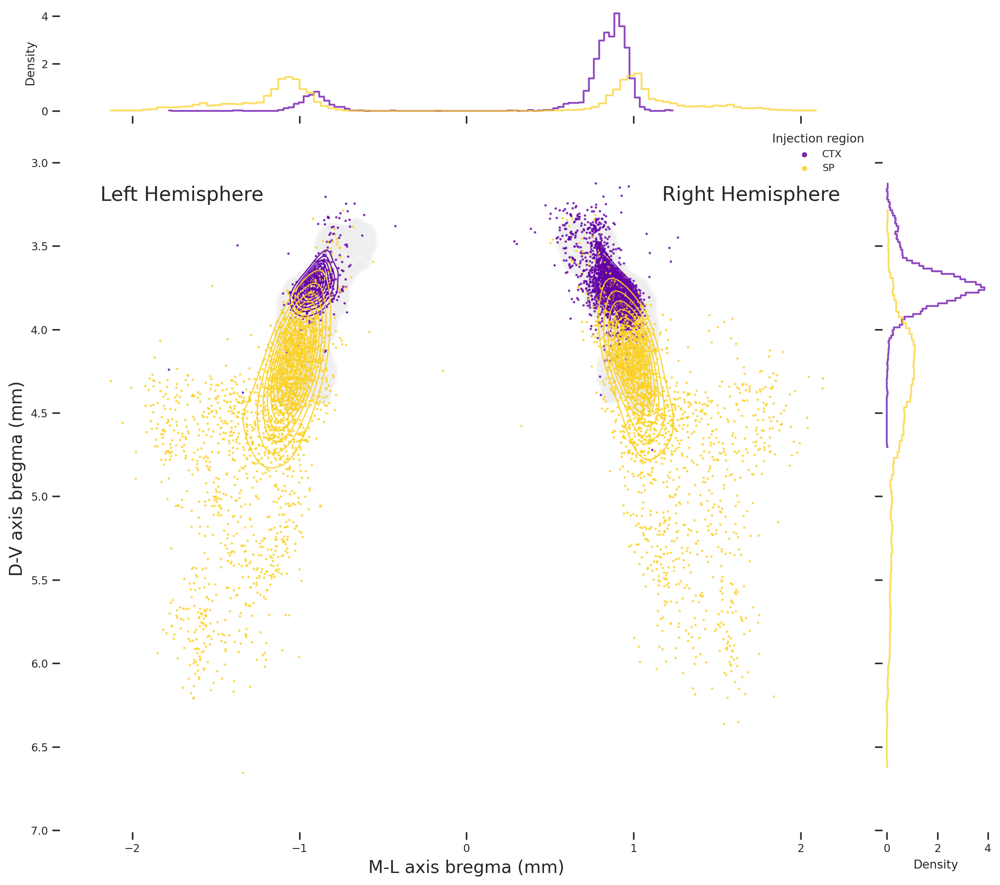

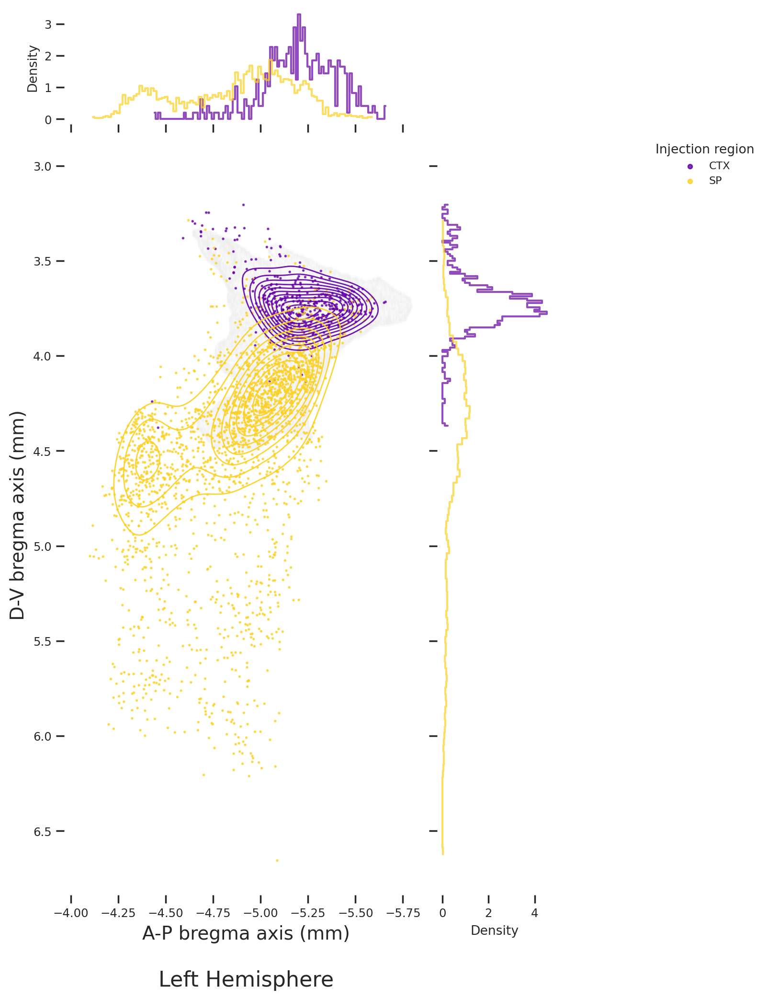

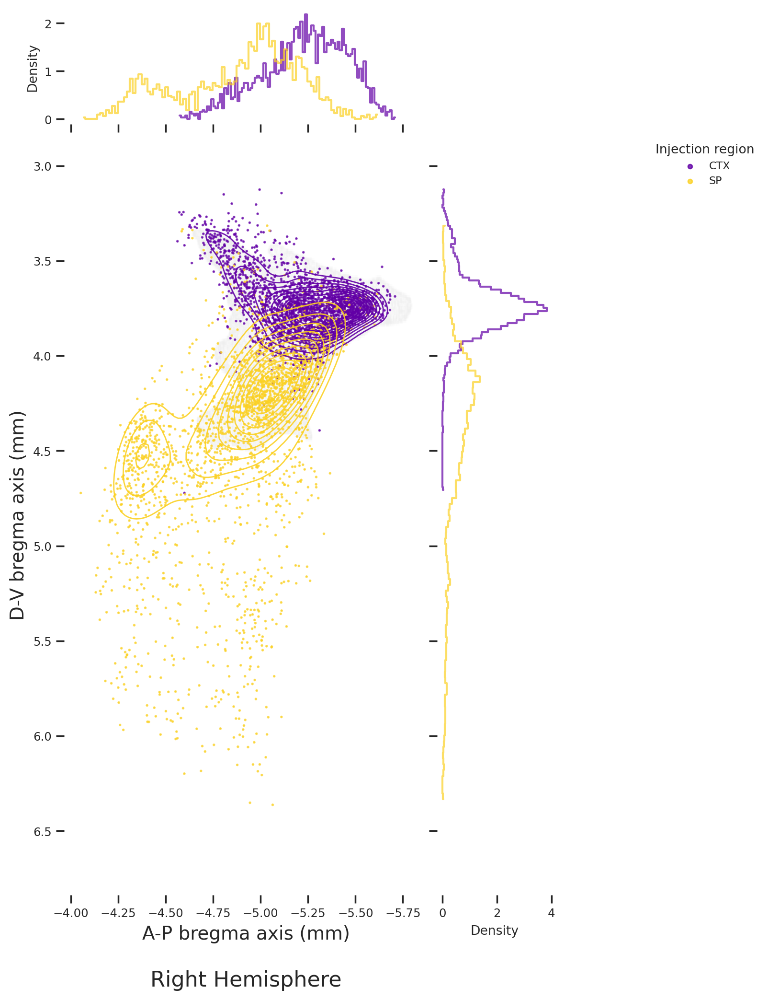

In [15]:
import scipy.stats

# ── Settings ─────────────────────────────────────────────────────────────────
ctx_sp_regions    = ["CTX", "SP"]
contour_levels    = 12
contour_linewidth = 1
contour_alpha     = 0.9

# Boolean masks for CTX and SP
ctx_sp_mask = retro_cells["injection_region"].isin(ctx_sp_regions).values

# Per-cell colors for CTX+SP scatter (reuses proj_colors)
ctx_sp_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if ctx_sp_mask[i]]

# ── Helper: KDE contour (skips 2 outermost levels) ───────────────────────────
def add_kde_contour(ax, x_vals, y_vals, color, n_levels=12, linewidth=1, alpha=0.9):
    if len(x_vals) <= 5:
        return
    kde = scipy.stats.gaussian_kde(np.vstack([x_vals, y_vals]))
    x_margin = 0.13 * (x_vals.max() - x_vals.min())
    y_margin = 0.13 * (y_vals.max() - y_vals.min())
    xs = np.linspace(x_vals.min() - x_margin, x_vals.max() + x_margin, 100)
    ys = np.linspace(y_vals.min() - y_margin, y_vals.max() + y_margin, 100)
    Xg, Yg = np.meshgrid(xs, ys)
    Z = kde(np.vstack([Xg.ravel(), Yg.ravel()])).reshape(Xg.shape)
    # Draw dummy red contour to extract levels, then remove and redraw in correct color
    contour_obj = ax.contour(Xg, Yg, Z, levels=n_levels, colors="r")
    levels_extracted = contour_obj.levels
    for c in contour_obj.collections:
        c.remove()
    if len(levels_extracted) > 2:
        ax.contour(Xg, Yg, Z, levels=levels_extracted[2:],
                   colors=[color], linewidths=linewidth, alpha=alpha)


# ═══════════════════════════════════════════════════════════════════════
# CORONAL (ML vs DV)  —  CTX & SP, bilateral, KDE computed per hemisphere
# Reuses bitmaps from cell 18: bitmap_mesh_orig/mirr, extent_orig/mirr
# ═══════════════════════════════════════════════════════════════════════

# Hemisphere masks for coronal (split by ML sign)
cor_left_mask  = mm_y <= 0
cor_right_mask = mm_y > 0

# Tight symmetric ML limits from CTX+SP cells (both hemispheres)
ml_ctx_sp  = mm_y[ctx_sp_mask]
dv_ctx_sp  = mm_z[ctx_sp_mask]
ml_half    = max(abs(ml_ctx_sp.min()), abs(ml_ctx_sp.max())) + 0.3
dv_mgn     = 0.1 * (dv_ctx_sp.max() - dv_ctx_sp.min())
cor_xlim   = (-ml_half, ml_half)
cor_ylim   = (dv_ctx_sp.min() - dv_mgn, dv_ctx_sp.max() + dv_mgn)

fig_cor = plt.figure(figsize=(14, 12))
ax_main = fig_cor.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top",   size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

# Both bitmap mesh halves
ax_main.imshow(bitmap_mesh_orig, extent=extent_orig, origin='lower',
               aspect='equal', interpolation='nearest')
ax_main.imshow(bitmap_mesh_mirr, extent=extent_mirr, origin='lower',
               aspect='equal', interpolation='nearest')

# Scatter — all CTX+SP cells
ax_main.scatter(mm_y[ctx_sp_mask], mm_z[ctx_sp_mask],
                c=ctx_sp_proj_colors, s=1, alpha=0.7)

# KDE contours — computed separately per hemisphere, drawn on shared axes
for region in ctx_sp_regions:
    reg_mask = retro_cells["injection_region"].values == region
    # Left hemisphere KDE
    left_mask  = reg_mask & cor_left_mask
    right_mask = reg_mask & cor_right_mask
    add_kde_contour(ax_main, mm_y[left_mask],  mm_z[left_mask],
                    color=region_col_map[region],
                    n_levels=contour_levels, linewidth=contour_linewidth, alpha=contour_alpha)
    add_kde_contour(ax_main, mm_y[right_mask], mm_z[right_mask],
                    color=region_col_map[region],
                    n_levels=contour_levels, linewidth=contour_linewidth, alpha=contour_alpha)

# Axis limits (set after contours so imshow doesn't expand them)
ax_main.set_xlim(cor_xlim)
ax_main.set_ylim(cor_ylim[1], cor_ylim[0])  # inverted DV

# Hemisphere labels
y_range = ax_main.get_ylim(); x_range = ax_main.get_xlim()
label_y = y_range[0] + 0.9 * (y_range[1] - y_range[0])
ax_main.text(x_range[0] + 0.15*(x_range[1]-x_range[0]), label_y, 'Left Hemisphere',
             fontsize=16, ha='center', va='center')
ax_main.text(x_range[1] - 0.15*(x_range[1]-x_range[0]), label_y, 'Right Hemisphere',
             fontsize=16, ha='center', va='center')

# Legend
for region in ctx_sp_regions:
    ax_main.scatter([], [], c=region_col_map[region], s=10, alpha=0.8, label=region)
ax_main.legend(title="Injection region", loc="best", fontsize=8, frameon=False)

# Marginal density histograms — all CTX+SP cells combined
for region in ctx_sp_regions:
    color    = region_col_map[region]
    reg_mask = retro_cells["injection_region"].values == region
    region_y = mm_y[reg_mask]; region_z = mm_z[reg_mask]
    if len(region_y) > 5:
        bins_x = min(100, max(5, len(region_y) // 2))
        hist_x, bin_edges_x = np.histogram(region_y, bins=bins_x, density=True)
        ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
    if len(region_z) > 5:
        bins_y = min(100, max(5, len(region_z) // 2))
        hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
        ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

ax_main.set_xlabel('M-L axis bregma (mm)', fontsize=14)
ax_main.set_ylabel('D-V axis bregma (mm)', fontsize=14)
ax_main.set_frame_on(False)
ax_x_hist.set_ylabel("Density"); ax_x_hist.set_frame_on(False)
ax_y_hist.set_xlabel("Density"); ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/ctx_sp_coronal_contours_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/ctx_sp_coronal_contours_bitmap_mesh.svg', format='svg', bbox_inches='tight')
plt.show()


# ═══════════════════════════════════════════════════════════════════════
# SAGITTAL LEFT (AP vs DV)  —  CTX & SP, left hemisphere only
# ═══════════════════════════════════════════════════════════════════════
ctx_sp_left_mask        = ctx_sp_mask & left_hemisphere_mask
ctx_sp_left_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if ctx_sp_left_mask[i]]

fig_sag_left_ctx_sp = plt.figure(figsize=(12, 12))
ax_main = fig_sag_left_ctx_sp.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top",   size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

ax_main.imshow(bitmap_mesh_left, extent=extent_left, origin='lower',
               aspect='equal', interpolation='nearest')
ax_main.scatter(mm_x[ctx_sp_left_mask], mm_z[ctx_sp_left_mask],
                c=ctx_sp_left_proj_colors, s=1, alpha=0.7)

for region in ctx_sp_regions:
    reg_left_mask = (retro_cells["injection_region"].values == region) & left_hemisphere_mask
    add_kde_contour(ax_main, mm_x[reg_left_mask], mm_z[reg_left_mask],
                    color=region_col_map[region],
                    n_levels=contour_levels, linewidth=contour_linewidth, alpha=contour_alpha)

for region in ctx_sp_regions:
    ax_main.scatter([], [], c=region_col_map[region], s=10, alpha=0.8, label=region)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

for region in ctx_sp_regions:
    color         = region_col_map[region]
    reg_left_mask = (retro_cells["injection_region"].values == region) & left_hemisphere_mask
    region_x = mm_x[reg_left_mask]; region_z = mm_z[reg_left_mask]
    if len(region_x) > 5:
        bins_x = min(100, max(5, len(region_x) // 2))
        hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
        ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
    if len(region_z) > 5:
        bins_y = min(100, max(5, len(region_z) // 2))
        hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
        ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Left Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits); ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis(); ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_x_hist.set_ylabel("Density"); ax_x_hist.set_frame_on(False)
ax_y_hist.set_xlabel("Density"); ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/ctx_sp_sagittal_left_contours_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/ctx_sp_sagittal_left_contours_bitmap_mesh.svg', format='svg', bbox_inches='tight')
plt.show()


# ═══════════════════════════════════════════════════════════════════════
# SAGITTAL RIGHT (AP vs DV)  —  CTX & SP, right hemisphere only
# ═══════════════════════════════════════════════════════════════════════
ctx_sp_right_mask        = ctx_sp_mask & right_hemisphere_mask
ctx_sp_right_proj_colors = [proj_colors[i] for i in range(len(proj_colors)) if ctx_sp_right_mask[i]]

fig_sag_right_ctx_sp = plt.figure(figsize=(12, 12))
ax_main = fig_sag_right_ctx_sp.add_subplot(111)
ax_main.set_aspect("equal", adjustable="box")

divider = make_axes_locatable(ax_main)
ax_x_hist = divider.append_axes("top",   size=1.2, pad=0.1, sharex=ax_main)
ax_y_hist = divider.append_axes("right", size=1.2, pad=0.1, sharey=ax_main)
plt.setp(ax_x_hist.get_xticklabels(), visible=False)
plt.setp(ax_y_hist.get_yticklabels(), visible=False)

ax_main.imshow(bitmap_mesh_right, extent=extent_right, origin='lower',
               aspect='equal', interpolation='nearest')
ax_main.scatter(mm_x[ctx_sp_right_mask], mm_z[ctx_sp_right_mask],
                c=ctx_sp_right_proj_colors, s=1, alpha=0.7)

for region in ctx_sp_regions:
    reg_right_mask = (retro_cells["injection_region"].values == region) & right_hemisphere_mask
    add_kde_contour(ax_main, mm_x[reg_right_mask], mm_z[reg_right_mask],
                    color=region_col_map[region],
                    n_levels=contour_levels, linewidth=contour_linewidth, alpha=contour_alpha)

for region in ctx_sp_regions:
    ax_main.scatter([], [], c=region_col_map[region], s=10, alpha=0.8, label=region)
ax_main.legend(title="Injection region", loc="upper left", bbox_to_anchor=(1.6, 1), fontsize=8, frameon=False)

for region in ctx_sp_regions:
    color          = region_col_map[region]
    reg_right_mask = (retro_cells["injection_region"].values == region) & right_hemisphere_mask
    region_x = mm_x[reg_right_mask]; region_z = mm_z[reg_right_mask]
    if len(region_x) > 5:
        bins_x = min(100, max(5, len(region_x) // 2))
        hist_x, bin_edges_x = np.histogram(region_x, bins=bins_x, density=True)
        ax_x_hist.step(bin_edges_x[:-1], hist_x, where="mid", color=color, alpha=0.7)
    if len(region_z) > 5:
        bins_y = min(100, max(5, len(region_z) // 2))
        hist_y, bin_edges_y = np.histogram(region_z, bins=bins_y, density=True)
        ax_y_hist.step(hist_y, bin_edges_y[:-1], where="mid", color=color, alpha=0.7)

ax_main.set_xlabel('A-P bregma axis (mm)', fontsize=14)
ax_main.set_ylabel('D-V bregma axis (mm)', fontsize=14)
ax_main.set_title('Right Hemisphere', fontsize=16, y=-0.13)
ax_main.set_xlim(ap_limits); ax_main.set_ylim(dv_limits)
ax_main.invert_yaxis(); ax_main.invert_xaxis()
ax_main.set_frame_on(False)
ax_x_hist.set_ylabel("Density"); ax_x_hist.set_frame_on(False)
ax_y_hist.set_xlabel("Density"); ax_y_hist.set_frame_on(False)

plt.savefig('/results/plots/ctx_sp_sagittal_right_contours_bitmap_mesh.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/ctx_sp_sagittal_right_contours_bitmap_mesh.svg', format='svg', bbox_inches='tight')
plt.show()

In [16]:
# Calculate global axes limits based on all points
# For coronal (ML vs DV)
all_ml = np.concatenate([
    mesh_vertices_bregma_mm[:, 2],           # mesh original
    -mesh_vertices_bregma_mm[:, 2],          # mesh mirrored
    mm_y                                     # all cells
])
all_dv = np.concatenate([
    mesh_vertices_bregma_mm[:, 1],           # mesh original
    mesh_vertices_bregma_mm[:, 1],           # mesh mirrored
    mm_z                                     # all cells
])
ml_min, ml_max = all_ml.min(), all_ml.max()
dv_min, dv_max = all_dv.min(), all_dv.max()
ml_margin = 0.05 * (ml_max - ml_min)
dv_margin = 0.05 * (dv_max - dv_min)
ml_lim = (ml_min - ml_margin, ml_max + ml_margin)
dv_lim = (dv_min - dv_margin, dv_max + dv_margin)

# For sagittal (AP vs DV)
all_ap = np.concatenate([
    mesh_vertices_bregma_mm[:, 0],           # mesh original
    mesh_vertices_bregma_mm[:, 0],           # mesh mirrored (AP unchanged)
    mm_x                                     # all cells
])
all_dv_sag = np.concatenate([
    mesh_vertices_bregma_mm[:, 1],           # mesh original
    mesh_vertices_bregma_mm[:, 1],           # mesh mirrored (DV unchanged)
    mm_z                                     # all cells
])
ap_min, ap_max = all_ap.min(), all_ap.max()
dv_min_sag, dv_max_sag = all_dv_sag.min(), all_dv_sag.max()
ap_margin = 0.05 * (ap_max - ap_min)
dv_margin_sag = 0.05 * (dv_max_sag - dv_min_sag)
ap_lim = (ap_min - ap_margin, ap_max + ap_margin)
dv_lim_sag = (dv_min_sag - dv_margin_sag, dv_max_sag + dv_margin_sag)

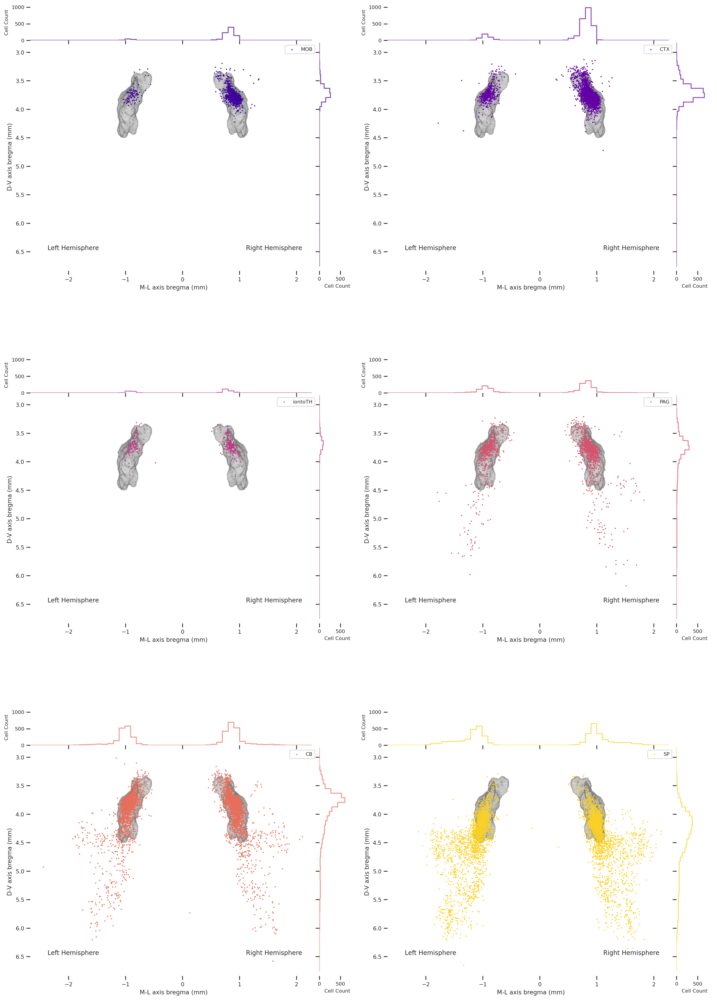

In [17]:
# --- Coronal (ML vs DV) Dynamic panels with marginal histograms ---
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Get all regions from region_col_map in their defined order
all_regions = list(region_col_map.keys())
n_regions = len(all_regions)

# Calculate grid dimensions: only regions (no mesh only panel)
n_cols = 2  # Keep 2 columns as requested (n_regions/2 grid)
n_rows = math.ceil(n_regions / n_cols)

# Create dynamic subplot grid - larger to accommodate histograms
fig = plt.figure(figsize=(16, 8*n_rows))

# Create panel configuration - one for each region
panel_configs = []
for region in all_regions:
    panel_configs.append({
        "title": region,  # Just the region name
        "region": region, 
        "color": region_col_map[region]
    })

# Calculate global histogram limits for consistency across all panels
# Get all cell coordinates to determine the maximum count range
all_ml_coords = mm_y  # All ML coordinates
all_dv_coords = mm_z  # All DV coordinates

# Create bins for the full data range to determine max counts
bins_ml_global = np.histogram_bin_edges(all_ml_coords, bins=50, range=ml_lim)
bins_dv_global = np.histogram_bin_edges(all_dv_coords, bins=50, range=dv_lim)

# Find maximum histogram values across all regions for consistent y-limits
max_count_ml = 0
max_count_dv = 0
for region in all_regions:
    mask = retro_cells["injection_region"] == region
    if mask.any():
        region_ml = mm_y[mask]
        region_dv = mm_z[mask]
        
        hist_ml, _ = np.histogram(region_ml, bins=bins_ml_global)
        hist_dv, _ = np.histogram(region_dv, bins=bins_dv_global)
        
        max_count_ml = max(max_count_ml, hist_ml.max())
        max_count_dv = max(max_count_dv, hist_dv.max())

# Add some margin to the max counts
max_count_ml *= 1.1
max_count_dv *= 1.1

# Plot each panel with marginal histograms
for i, config in enumerate(panel_configs):
    # Calculate subplot position
    row = i // n_cols
    col = i % n_cols
    
    # Create main subplot
    ax_main = plt.subplot2grid((n_rows, n_cols), (row, col), fig=fig)
    ax_main.set_aspect("equal", adjustable="box")
    
    # Create histogram axes using make_axes_locatable
    divider = make_axes_locatable(ax_main)
    ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
    ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
    
    # Hide overlapping tick labels
    plt.setp(ax_x_hist.get_xticklabels(), visible=False)
    plt.setp(ax_y_hist.get_yticklabels(), visible=False)
    
    # Plot mesh (original)
    ax_main.scatter(mesh_vertices_bregma_mm[:, 2], mesh_vertices_bregma_mm[:, 1], 
                   color='gray', s=dot_size, alpha=mesh_alpha)
    
    # Plot mirrored mesh
    mesh_vertices_bregma_mm_mirror = mesh_vertices_bregma_mm.copy()
    mesh_vertices_bregma_mm_mirror[:, 2] *= -1
    ax_main.scatter(mesh_vertices_bregma_mm_mirror[:, 2], mesh_vertices_bregma_mm_mirror[:, 1], 
                   color='gray', s=dot_size, alpha=mesh_alpha)
    
    # Plot cells for this region
    mask = retro_cells["injection_region"] == config["region"]
    if mask.any():  # Only plot if there are cells for this region
        ax_main.scatter(mm_y[mask], mm_z[mask], c=config["color"], s=1, alpha=0.9, 
                       label=config["region"])
        ax_main.legend(loc="best", fontsize=8)
        
        # Create marginal histograms for this specific region
        region_y = mm_y[mask]  # ML coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (ML distribution) with global bins and limits
        if len(region_y) > 5:
            hist_x, _ = np.histogram(region_y, bins=bins_ml_global)
            ax_x_hist.step(bins_ml_global[:-1], hist_x, where="mid", color=config["color"], alpha=0.7)
            ax_x_hist.set_ylim(0, max_count_ml)  # Set consistent y-limit
        
        # Y-axis histogram (DV distribution) with global bins and limits
        if len(region_z) > 5:
            hist_y, _ = np.histogram(region_z, bins=bins_dv_global)
            ax_y_hist.step(hist_y, bins_dv_global[:-1], where="mid", color=config["color"], alpha=0.7)
            ax_y_hist.set_xlim(0, max_count_dv)  # Set consistent x-limit
    
    # Set axes limits first
    ax_main.set_xlim(ml_lim)
    ax_main.set_ylim(dv_lim)
    
    # Add hemisphere labels using global coordinate system for consistent positioning
    label_y = dv_lim[0] + 0.9 * (dv_lim[1] - dv_lim[0])  # Near bottom of plot using global limits
    left_x = ml_lim[0] + 0.15 * (ml_lim[1] - ml_lim[0])   # 15% from left edge using global limits
    right_x = ml_lim[1] - 0.15 * (ml_lim[1] - ml_lim[0])  # 15% from right edge using global limits
    
    ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=10, ha='center', va='center')
    ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=10, ha='center', va='center')
    
    ax_main.set_xlabel('M-L axis bregma (mm)')
    ax_main.set_ylabel('D-V axis bregma (mm)')
    ax_main.invert_yaxis()
    ax_main.set_frame_on(False)
    
    # Format histogram axes
    ax_x_hist.set_ylabel("Cell Count", fontsize=8)
    ax_y_hist.set_xlabel("Cell Count", fontsize=8)
    ax_x_hist.set_frame_on(False)
    ax_y_hist.set_frame_on(False)
    ax_x_hist.tick_params(labelsize=8)
    ax_y_hist.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('/results/plots/individual_retro_coronal_plot_with_histograms.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/individual_retro_coronal_plot_with_histograms.svg', format='svg', bbox_inches='tight')

plt.show()

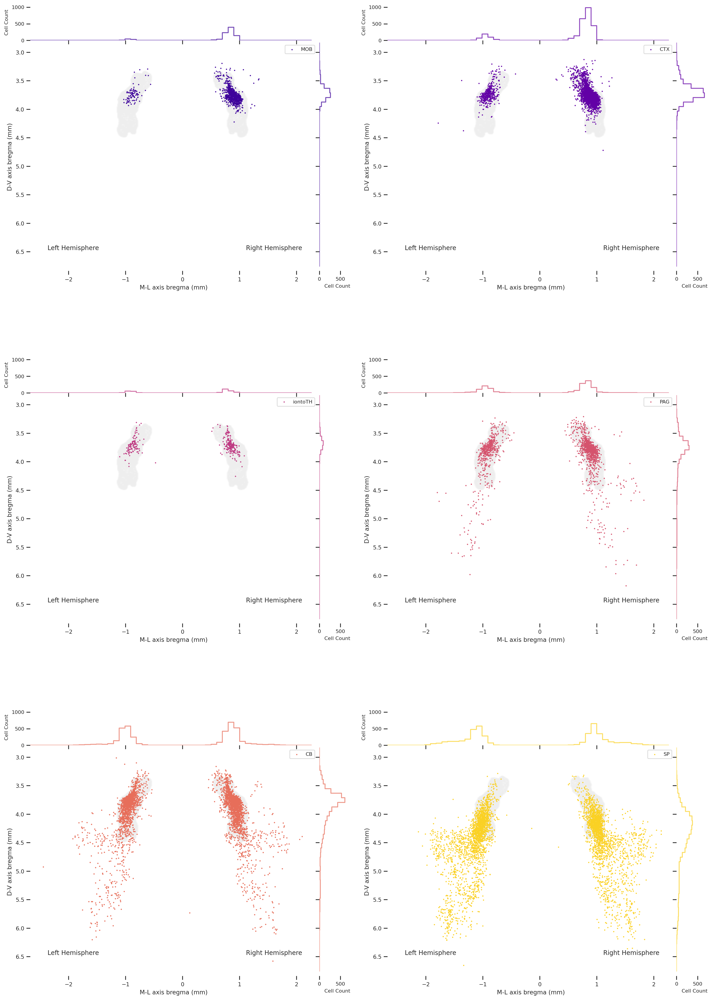

In [18]:
# --- Coronal (ML vs DV) Dynamic panels with marginal histograms - BITMAP MESH ---
# Get all regions from region_col_map in their defined order
all_regions = list(region_col_map.keys())
n_regions = len(all_regions)

# Calculate grid dimensions: only regions (no mesh only panel)
n_cols = 2  # Keep 2 columns as requested (n_regions/2 grid)
n_rows = math.ceil(n_regions / n_cols)

# Create dynamic subplot grid - larger to accommodate histograms
fig = plt.figure(figsize=(16, 8*n_rows))

# Create panel configuration - one for each region
panel_configs = []
for region in all_regions:
    panel_configs.append({
        "title": region,  # Just the region name
        "region": region, 
        "color": region_col_map[region]
    })

# PRE-CALCULATE BITMAP MESH for faster rendering and smaller file size
def create_mesh_bitmap(mesh_vertices, limits, resolution=500):
    """Create a bitmap representation of the mesh for faster rendering"""
    from scipy.ndimage import gaussian_filter
    ml_lim, dv_lim = limits
    
    # Create 2D histogram of mesh points
    hist, x_edges, y_edges = np.histogram2d(
        mesh_vertices[:, 2], mesh_vertices[:, 1],  # ML, DV coordinates
        bins=resolution,
        range=[[ml_lim[0], ml_lim[1]], [dv_lim[0], dv_lim[1]]]
    )
    
    # Gaussian smoothing for antialiased, soft mesh edges
    binary_mask = (hist > 0).astype(float)
    alpha_channel = gaussian_filter(binary_mask, sigma=0.8)
    alpha_channel = np.clip(alpha_channel, 0, 1)
    bitmap = np.zeros((resolution, resolution, 4))
    bitmap[:, :, :3] = 0.35  # Gray RGB (darker)
    bitmap[:, :, 3] = alpha_channel.T * mesh_alpha
    
    return bitmap, x_edges, y_edges

# Create bitmap for original mesh
mesh_bitmap, x_edges, y_edges = create_mesh_bitmap(mesh_vertices_bregma_mm, (ml_lim, dv_lim))

# Create bitmap for mirrored mesh
mesh_vertices_mirror = mesh_vertices_bregma_mm.copy()
mesh_vertices_mirror[:, 2] *= -1
mesh_bitmap_mirror, _, _ = create_mesh_bitmap(mesh_vertices_mirror, (ml_lim, dv_lim))

# Combine both meshes into one bitmap
combined_mesh_bitmap = np.maximum(mesh_bitmap, mesh_bitmap_mirror)

# Calculate global histogram limits for consistency across all panels
all_ml_coords = mm_y  # All ML coordinates
all_dv_coords = mm_z  # All DV coordinates

# Create bins for the full data range to determine max counts
bins_ml_global = np.histogram_bin_edges(all_ml_coords, bins=50, range=ml_lim)
bins_dv_global = np.histogram_bin_edges(all_dv_coords, bins=50, range=dv_lim)

# Find maximum histogram values across all regions for consistent y-limits
max_count_ml = 0
max_count_dv = 0
for region in all_regions:
    mask = retro_cells["injection_region"] == region
    if mask.any():
        region_ml = mm_y[mask]
        region_dv = mm_z[mask]
        
        hist_ml, _ = np.histogram(region_ml, bins=bins_ml_global)
        hist_dv, _ = np.histogram(region_dv, bins=bins_dv_global)
        
        max_count_ml = max(max_count_ml, hist_ml.max())
        max_count_dv = max(max_count_dv, hist_dv.max())

# Add some margin to the max counts
max_count_ml *= 1.1
max_count_dv *= 1.1

# Plot each panel with marginal histograms
for i, config in enumerate(panel_configs):
    # Calculate subplot position
    row = i // n_cols
    col = i % n_cols
    
    # Create main subplot
    ax_main = plt.subplot2grid((n_rows, n_cols), (row, col), fig=fig)
    ax_main.set_aspect("equal", adjustable="box")
    
    # Create histogram axes using make_axes_locatable
    divider = make_axes_locatable(ax_main)
    ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
    ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
    
    # Hide overlapping tick labels
    plt.setp(ax_x_hist.get_xticklabels(), visible=False)
    plt.setp(ax_y_hist.get_yticklabels(), visible=False)
    
    # REPLACE mesh scatter with bitmap background
    ax_main.imshow(combined_mesh_bitmap, 
                   extent=[ml_lim[0], ml_lim[1], dv_lim[0], dv_lim[1]], 
                   origin='lower', aspect='equal', interpolation='nearest')
    
    # Plot cells for this region
    mask = retro_cells["injection_region"] == config["region"]
    if mask.any():  # Only plot if there are cells for this region
        ax_main.scatter(mm_y[mask], mm_z[mask], c=config["color"], s=1, alpha=0.9, 
                       label=config["region"])
        ax_main.legend(loc="best", fontsize=8)
        
        # Create marginal histograms for this specific region
        region_y = mm_y[mask]  # ML coordinates
        region_z = mm_z[mask]  # DV coordinates
        
        # X-axis histogram (ML distribution) with global bins and limits
        if len(region_y) > 5:
            hist_x, _ = np.histogram(region_y, bins=bins_ml_global)
            ax_x_hist.step(bins_ml_global[:-1], hist_x, where="mid", color=config["color"], alpha=0.7)
            ax_x_hist.set_ylim(0, max_count_ml)  # Set consistent y-limit
        
        # Y-axis histogram (DV distribution) with global bins and limits
        if len(region_z) > 5:
            hist_y, _ = np.histogram(region_z, bins=bins_dv_global)
            ax_y_hist.step(hist_y, bins_dv_global[:-1], where="mid", color=config["color"], alpha=0.7)
            ax_y_hist.set_xlim(0, max_count_dv)  # Set consistent x-limit
    
    # Set axes limits first
    ax_main.set_xlim(ml_lim)
    ax_main.set_ylim(dv_lim)
    
    # Add hemisphere labels using global coordinate system for consistent positioning
    label_y = dv_lim[0] + 0.9 * (dv_lim[1] - dv_lim[0])  # Near bottom of plot using global limits
    left_x = ml_lim[0] + 0.15 * (ml_lim[1] - ml_lim[0])   # 15% from left edge using global limits
    right_x = ml_lim[1] - 0.15 * (ml_lim[1] - ml_lim[0])  # 15% from right edge using global limits
    
    ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=10, ha='center', va='center')
    ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=10, ha='center', va='center')
    
    ax_main.set_xlabel('M-L axis bregma (mm)')
    ax_main.set_ylabel('D-V axis bregma (mm)')
    ax_main.invert_yaxis()
    ax_main.set_frame_on(False)
    
    # Format histogram axes
    ax_x_hist.set_ylabel("Cell Count", fontsize=8)
    ax_y_hist.set_xlabel("Cell Count", fontsize=8)
    ax_x_hist.set_frame_on(False)
    ax_y_hist.set_frame_on(False)
    ax_x_hist.tick_params(labelsize=8)
    ax_y_hist.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('/results/plots/individual_retro_coronal_plot_with_histograms_bitmap.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/individual_retro_coronal_plot_with_histograms_bitmap.svg', format='svg', bbox_inches='tight')

plt.show()

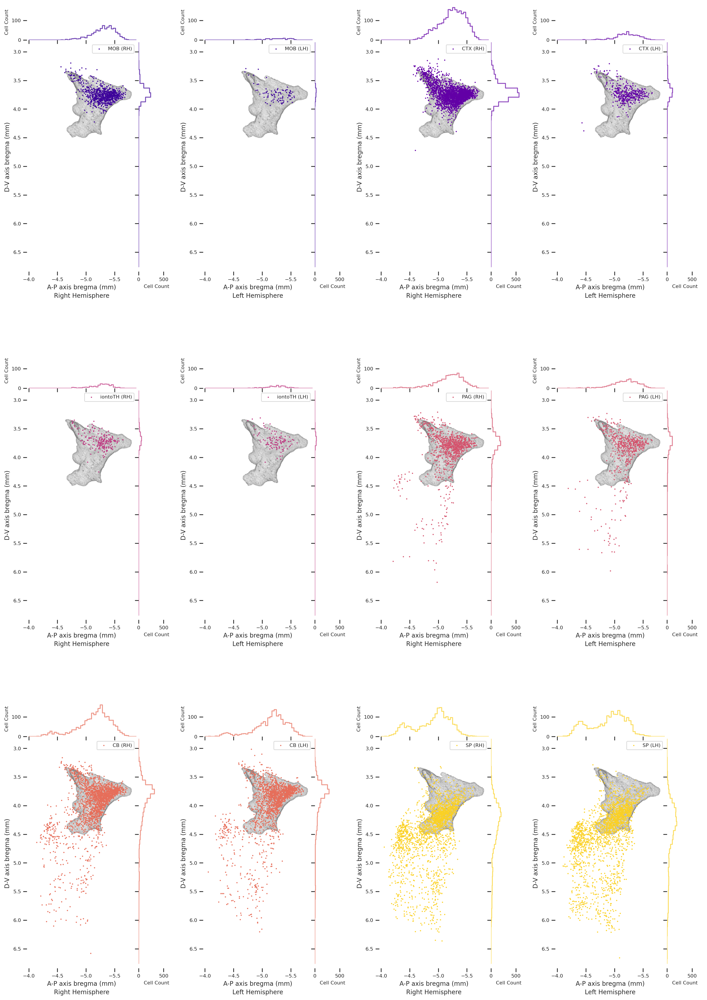

In [19]:
# --- Sagittal (AP vs DV) Dynamic panels with marginal histograms - RH/LH separated ---
# Get all regions from region_col_map in their defined order
all_regions = list(region_col_map.keys())
n_regions = len(all_regions)

# Calculate grid dimensions: 2 columns per region (RH + LH)
n_cols = 4  # 2 regions per row, each with RH and LH
n_rows = math.ceil(n_regions / 2)  # Pair regions in rows

# Create dynamic subplot grid - SAME SIZE as coronal for consistency
fig = plt.figure(figsize=(16, 8*n_rows))  # Changed from (20, 8*n_rows) to match coronal

# Create panel configuration - RH and LH for each region
panel_configs = []
for region in all_regions:
    # Right hemisphere
    panel_configs.append({
        "title": f"Right Hemisphere",
        "region": region, 
        "hemisphere": "RH",
        "color": region_col_map[region]
    })
    # Left hemisphere  
    panel_configs.append({
        "title": f"Left Hemisphere",
        "region": region,
        "hemisphere": "LH", 
        "color": region_col_map[region]
    })

# Calculate global histogram limits for consistency across all panels
# Get all cell coordinates to determine the maximum count range
all_ap_coords = mm_x  # All AP coordinates
all_dv_coords = mm_z  # All DV coordinates

# Create bins for the full data range to determine max counts
bins_ap_global = np.histogram_bin_edges(all_ap_coords, bins=50, range=ap_lim)
bins_dv_global = np.histogram_bin_edges(all_dv_coords, bins=50, range=dv_lim)

# Find maximum histogram values across all regions and hemispheres for consistent y-limits
max_count_ap = 0
max_count_dv = 0
for region in all_regions:
    for hemisphere in ["RH", "LH"]:
        if hemisphere == "RH":
            hemi_mask = mm_y >= 0  # Right hemisphere (positive ML)
        else:
            hemi_mask = mm_y < 0   # Left hemisphere (negative ML)
        
        region_mask = retro_cells["injection_region"] == region
        combined_mask = region_mask & hemi_mask
        
        if combined_mask.any():
            region_ap = mm_x[combined_mask]
            region_dv = mm_z[combined_mask]
            
            hist_ap, _ = np.histogram(region_ap, bins=bins_ap_global)
            hist_dv, _ = np.histogram(region_dv, bins=bins_dv_global)
            
            max_count_ap = max(max_count_ap, hist_ap.max())
            max_count_dv = max(max_count_dv, hist_dv.max())

# Add some margin to the max counts
max_count_ap *= 1.1
max_count_dv *= 1.1

# Plot each panel with marginal histograms
for i, config in enumerate(panel_configs):
    # Calculate subplot position
    row = i // n_cols
    col = i % n_cols
    
    # Create main subplot
    ax_main = plt.subplot2grid((n_rows, n_cols), (row, col), fig=fig)
    ax_main.set_aspect("equal", adjustable="box")
    
    # Create histogram axes using make_axes_locatable
    divider = make_axes_locatable(ax_main)
    ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
    ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
    
    # Hide overlapping tick labels
    plt.setp(ax_x_hist.get_xticklabels(), visible=False)
    plt.setp(ax_y_hist.get_yticklabels(), visible=False)
    
    # Plot mesh for the appropriate hemisphere
    if config["hemisphere"] == "RH":
        # Plot original mesh (right hemisphere)
        ax_main.scatter(mesh_vertices_bregma_mm[:, 0], mesh_vertices_bregma_mm[:, 1], 
                       color='gray', s=dot_size, alpha=mesh_alpha)
        hemi_mask = mm_y >= 0  # Right hemisphere cells
    else:
        # Plot mirrored mesh (left hemisphere)
        mesh_vertices_bregma_mm_mirror = mesh_vertices_bregma_mm.copy()
        mesh_vertices_bregma_mm_mirror[:, 2] *= -1
        ax_main.scatter(mesh_vertices_bregma_mm_mirror[:, 0], mesh_vertices_bregma_mm_mirror[:, 1], 
                       color='gray', s=dot_size, alpha=mesh_alpha)
        hemi_mask = mm_y < 0   # Left hemisphere cells
    
    # Plot cells for this region and hemisphere
    region_mask = retro_cells["injection_region"] == config["region"]
    combined_mask = region_mask & hemi_mask
    
    if combined_mask.any():  # Only plot if there are cells for this region and hemisphere
        ax_main.scatter(mm_x[combined_mask], mm_z[combined_mask], c=config["color"], s=1, alpha=0.9, 
                       label=f'{config["region"]} ({config["hemisphere"]})')
        ax_main.legend(loc="best", fontsize=8)
        
        # Create marginal histograms for this specific region and hemisphere
        region_x = mm_x[combined_mask]  # AP coordinates
        region_z = mm_z[combined_mask]  # DV coordinates
        
        # X-axis histogram (AP distribution) with global bins and limits
        if len(region_x) > 5:
            hist_x, _ = np.histogram(region_x, bins=bins_ap_global)
            ax_x_hist.step(bins_ap_global[:-1], hist_x, where="mid", color=config["color"], alpha=0.7)
            ax_x_hist.set_ylim(0, max_count_ap)  # Set consistent y-limit
        
        # Y-axis histogram (DV distribution) with global bins and limits
        if len(region_z) > 5:
            hist_y, _ = np.histogram(region_z, bins=bins_dv_global)
            ax_y_hist.step(hist_y, bins_dv_global[:-1], where="mid", color=config["color"], alpha=0.7)
            ax_y_hist.set_xlim(0, max_count_dv)  # Set consistent x-limit
    
    # Set axes limits
    ax_main.set_xlim(ap_lim)
    ax_main.set_ylim(dv_lim)
    
    # Add title using consistent format with SAME FONT SIZE as coronal
    ax_main.set_title(config["title"], fontsize=10, y=-0.13)  # Changed from fontsize=16 to 10
    
    ax_main.set_xlabel('A-P axis bregma (mm)', fontsize=10)  # Added fontsize=10
    ax_main.set_ylabel('D-V axis bregma (mm)', fontsize=10)  # Added fontsize=10
    ax_main.tick_params(labelsize=8)  # Added tick label size consistency
    ax_main.invert_yaxis()
    ax_main.invert_xaxis()
    ax_main.set_frame_on(False)
    
    # Format histogram axes
    ax_x_hist.set_ylabel("Cell Count", fontsize=8)
    ax_y_hist.set_xlabel("Cell Count", fontsize=8)
    ax_x_hist.set_frame_on(False)
    ax_y_hist.set_frame_on(False)
    ax_x_hist.tick_params(labelsize=8)
    ax_y_hist.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('/results/plots/individual_retro_sagittal_plot_RH_LH_separated.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/individual_retro_sagittal_plot_RH_LH_separated.svg', format='svg', bbox_inches='tight')

plt.show()

In [ ]:
# Get all regions from region_col_map in their defined order
all_regions = list(region_col_map.keys())
n_regions = len(all_regions)

# Calculate grid dimensions: 2 columns per region (RH + LH)
n_cols = 4  # 2 regions per row, each with RH and LH
n_rows = math.ceil(n_regions / 2)  # Pair regions in rows

# Create dynamic subplot grid - SAME SIZE as coronal for consistency
fig = plt.figure(figsize=(16, 8*n_rows))  # Changed from (20, 8*n_rows) to match coronal

# PRE-CALCULATE BITMAP MESH for sagittal view
def create_sagittal_mesh_bitmap(mesh_vertices, limits, resolution=500):
    """Create a bitmap representation of the mesh for sagittal view"""
    ap_lim, dv_lim = limits
    
    # Create 2D histogram of mesh points
    hist, x_edges, y_edges = np.histogram2d(
        mesh_vertices[:, 0], mesh_vertices[:, 1],  # AP, DV coordinates
        bins=resolution,
        range=[[ap_lim[0], ap_lim[1]], [dv_lim[0], dv_lim[1]]]
    )
    
    # Convert to binary mask (mesh present/absent)
    mesh_mask = hist > 0
    
    # Create RGBA image (gray with alpha)
    bitmap = np.zeros((resolution, resolution, 4))
    bitmap[mesh_mask.T] = [0.5, 0.5, 0.5, mesh_alpha]  # Gray with your alpha
    
    return bitmap

# Create bitmap for original mesh (RH)
mesh_bitmap_rh = create_sagittal_mesh_bitmap(mesh_vertices_bregma_mm, (ap_lim, dv_lim))

# Create bitmap for mirrored mesh (LH)
mesh_vertices_mirror = mesh_vertices_bregma_mm.copy()
mesh_vertices_mirror[:, 2] *= -1
mesh_bitmap_lh = create_sagittal_mesh_bitmap(mesh_vertices_mirror, (ap_lim, dv_lim))

# Create panel configuration - RH and LH for each region
panel_configs = []
for region in all_regions:
    # Right hemisphere
    panel_configs.append({
        "title": f"Right Hemisphere",
        "region": region, 
        "hemisphere": "RH",
        "color": region_col_map[region]
    })
    # Left hemisphere  
    panel_configs.append({
        "title": f"Left Hemisphere",
        "region": region,
        "hemisphere": "LH", 
        "color": region_col_map[region]
    })

# Calculate global histogram limits for consistency across all panels
all_ap_coords = mm_x  # All AP coordinates
all_dv_coords = mm_z  # All DV coordinates

# Create bins for the full data range to determine max counts
bins_ap_global = np.histogram_bin_edges(all_ap_coords, bins=50, range=ap_lim)
bins_dv_global = np.histogram_bin_edges(all_dv_coords, bins=50, range=dv_lim)

# Find maximum histogram values across all regions and hemispheres for consistent y-limits
max_count_ap = 0
max_count_dv = 0
for region in all_regions:
    for hemisphere in ["RH", "LH"]:
        if hemisphere == "RH":
            hemi_mask = mm_y >= 0  # Right hemisphere (positive ML)
        else:
            hemi_mask = mm_y < 0   # Left hemisphere (negative ML)
        
        region_mask = retro_cells["injection_region"] == region
        combined_mask = region_mask & hemi_mask
        
        if combined_mask.any():
            region_ap = mm_x[combined_mask]
            region_dv = mm_z[combined_mask]
            
            hist_ap, _ = np.histogram(region_ap, bins=bins_ap_global)
            hist_dv, _ = np.histogram(region_dv, bins=bins_dv_global)
            
            max_count_ap = max(max_count_ap, hist_ap.max())
            max_count_dv = max(max_count_dv, hist_dv.max())

# Add some margin to the max counts
max_count_ap *= 1.1
max_count_dv *= 1.1

# Plot each panel with marginal histograms
for i, config in enumerate(panel_configs):
    # Calculate subplot position
    row = i // n_cols
    col = i % n_cols
    
    # Create main subplot
    ax_main = plt.subplot2grid((n_rows, n_cols), (row, col), fig=fig)
    ax_main.set_aspect("equal", adjustable="box")
    
    # Create histogram axes using make_axes_locatable
    divider = make_axes_locatable(ax_main)
    ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
    ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
    
    # Hide overlapping tick labels
    plt.setp(ax_x_hist.get_xticklabels(), visible=False)
    plt.setp(ax_y_hist.get_yticklabels(), visible=False)
    
    # REPLACE mesh scatter with bitmap background for appropriate hemisphere
    if config["hemisphere"] == "RH":
        ax_main.imshow(mesh_bitmap_rh, 
                       extent=[ap_lim[0], ap_lim[1], dv_lim[0], dv_lim[1]], 
                       origin='lower', aspect='equal', interpolation='nearest')
        hemi_mask = mm_y >= 0  # Right hemisphere cells
    else:
        ax_main.imshow(mesh_bitmap_lh, 
                       extent=[ap_lim[0], ap_lim[1], dv_lim[0], dv_lim[1]], 
                       origin='lower', aspect='equal', interpolation='nearest')
        hemi_mask = mm_y < 0   # Left hemisphere cells
    
    # Plot cells for this region and hemisphere
    region_mask = retro_cells["injection_region"] == config["region"]
    combined_mask = region_mask & hemi_mask
    
    if combined_mask.any():  # Only plot if there are cells for this region and hemisphere
        ax_main.scatter(mm_x[combined_mask], mm_z[combined_mask], c=config["color"], s=1, alpha=0.9, 
                       label=f'{config["region"]} ({config["hemisphere"]})')
        ax_main.legend(loc="best", fontsize=8)
        
        # Create marginal histograms for this specific region and hemisphere
        region_x = mm_x[combined_mask]  # AP coordinates
        region_z = mm_z[combined_mask]  # DV coordinates
        
        # X-axis histogram (AP distribution) with global bins and limits
        if len(region_x) > 5:
            hist_x, _ = np.histogram(region_x, bins=bins_ap_global)
            ax_x_hist.step(bins_ap_global[:-1], hist_x, where="mid", color=config["color"], alpha=0.7)
            ax_x_hist.set_ylim(0, max_count_ap)  # Set consistent y-limit
        
        # Y-axis histogram (DV distribution) with global bins and limits
        if len(region_z) > 5:
            hist_y, _ = np.histogram(region_z, bins=bins_dv_global)
            ax_y_hist.step(hist_y, bins_dv_global[:-1], where="mid", color=config["color"], alpha=0.7)
            ax_y_hist.set_xlim(0, max_count_dv)  # Set consistent x-limit
    
    # Set axes limits
    ax_main.set_xlim(ap_lim)
    ax_main.set_ylim(dv_lim)
    
    # Add title using consistent format with SAME FONT SIZE as coronal
    ax_main.set_title(config["title"], fontsize=10, y=-0.13)  # Changed from fontsize=16 to 10
    
    ax_main.set_xlabel('A-P axis bregma (mm)', fontsize=10)  # Added fontsize=10
    ax_main.set_ylabel('D-V axis bregma (mm)', fontsize=10)  # Added fontsize=10
    ax_main.tick_params(labelsize=8)  # Added tick label size consistency
    ax_main.invert_yaxis()
    ax_main.invert_xaxis()
    ax_main.set_frame_on(False)
    
    # Format histogram axes
    ax_x_hist.set_ylabel("Cell Count", fontsize=8)
    ax_y_hist.set_xlabel("Cell Count", fontsize=8)
    ax_x_hist.set_frame_on(False)
    ax_y_hist.set_frame_on(False)
    ax_x_hist.tick_params(labelsize=8)
    ax_y_hist.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('/results/plots/individual_retro_sagittal_plot_RH_LH_separated_bitmap.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('/results/plots/individual_retro_sagittal_plot_RH_LH_separated_bitmap.svg', format='svg', bbox_inches='tight')

plt.show()

In [ ]:
def create_individual_plots(view_type, regions, region_col_map, retro_cells, mm_coords, mesh_vertices, limits, dot_size, mesh_alpha):
    """
    Create individual plots for coronal or sagittal views with consistent proportions.
    """
    
    # Set up coordinates and labels based on view type
    if view_type == 'coronal':
        x_coords, y_coords = mm_coords['y'], mm_coords['z']  # ML, DV
        x_lim, y_lim = limits['ml'], limits['dv']
        x_label, y_label = 'M-L axis bregma (mm)', 'D-V axis bregma (mm)'
        mesh_x, mesh_y = mesh_vertices[:, 2], mesh_vertices[:, 1]
        hemispheres = [None]  # Single plot
        fig_title_prefix = 'Coronal View'
        filename_suffix = ''
    else:  # sagittal
        x_coords, y_coords = mm_coords['x'], mm_coords['z']  # AP, DV  
        x_lim, y_lim = limits['ap'], limits['dv']
        x_label, y_label = 'A-P axis bregma (mm)', 'D-V axis bregma (mm)'
        mesh_x, mesh_y = mesh_vertices[:, 0], mesh_vertices[:, 1]
        hemispheres = ['RH', 'LH']  # Two subplots
        fig_title_prefix = 'Sagittal View'
        filename_suffix = '_RH_LH'
    
    # Calculate global histogram bins and limits
    bins_x = np.histogram_bin_edges(x_coords, bins=50, range=x_lim)
    bins_y = np.histogram_bin_edges(y_coords, bins=50, range=y_lim)
    
    max_count_x = max_count_y = 0
    for region in regions:
        for hemi in (['RH', 'LH'] if view_type == 'sagittal' else [None]):
            if hemi:
                hemi_mask = mm_coords['y'] >= 0 if hemi == 'RH' else mm_coords['y'] < 0
                mask = (retro_cells["injection_region"] == region) & hemi_mask
            else:
                mask = retro_cells["injection_region"] == region
                
            if mask.any():
                hist_x, _ = np.histogram(x_coords[mask], bins=bins_x)
                hist_y, _ = np.histogram(y_coords[mask], bins=bins_y)
                max_count_x = max(max_count_x, hist_x.max())
                max_count_y = max(max_count_y, hist_y.max())
    
    max_count_x *= 1.1
    max_count_y *= 1.1
    
    # FIXED: Both views get the same base figure size
    if view_type == 'coronal':
        fig_size = (8, 6)  # Your original coronal size
    else:  # sagittal  
        fig_size = (16, 6)  # Your original sagittal size - 2x width for 2 hemispheres
    
    # Create plots for each region
    for region in regions:
        fig = plt.figure(figsize=fig_size)
        
        for i, hemi in enumerate(hemispheres):
            ax_main = plt.subplot2grid((1, len(hemispheres)), (0, i), fig=fig) if len(hemispheres) > 1 else plt.subplot(1, 1, 1)
            ax_main.set_aspect("equal", adjustable="box")
            
            # Create histograms
            divider = make_axes_locatable(ax_main)
            ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
            ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
            plt.setp(ax_x_hist.get_xticklabels(), visible=False)
            plt.setp(ax_y_hist.get_yticklabels(), visible=False)
            
            # Plot mesh
            if view_type == 'sagittal' and hemi == 'LH':
                mesh_vertices_mirror = mesh_vertices.copy()
                mesh_vertices_mirror[:, 2] *= -1
                ax_main.scatter(mesh_vertices_mirror[:, 0], mesh_vertices_mirror[:, 1], 
                               color='gray', s=dot_size, alpha=mesh_alpha)
            else:
                ax_main.scatter(mesh_x, mesh_y, color='gray', s=dot_size, alpha=mesh_alpha)
                if view_type == 'coronal':  # Add mirrored mesh for coronal
                    mesh_vertices_mirror = mesh_vertices.copy()
                    mesh_vertices_mirror[:, 2] *= -1
                    ax_main.scatter(mesh_vertices_mirror[:, 2], mesh_vertices_mirror[:, 1], 
                                   color='gray', s=dot_size, alpha=mesh_alpha)
            
            # Plot cells
            if hemi:
                hemi_mask = mm_coords['y'] >= 0 if hemi == 'RH' else mm_coords['y'] < 0
                mask = (retro_cells["injection_region"] == region) & hemi_mask
                label = f'{region} ({hemi})'
            else:
                mask = retro_cells["injection_region"] == region
                label = region
            
            if mask.any():
                ax_main.scatter(x_coords[mask], y_coords[mask], c=region_col_map[region], 
                               s=1, alpha=0.9, label=label)
                ax_main.legend(loc="best", fontsize=10)
                
                # Histograms
                if len(x_coords[mask]) > 5:
                    hist_x, _ = np.histogram(x_coords[mask], bins=bins_x)
                    ax_x_hist.step(bins_x[:-1], hist_x, where="mid", color=region_col_map[region], alpha=0.7)
                    ax_x_hist.set_ylim(0, max_count_x)
                
                if len(y_coords[mask]) > 5:
                    hist_y, _ = np.histogram(y_coords[mask], bins=bins_y)
                    ax_y_hist.step(hist_y, bins_y[:-1], where="mid", color=region_col_map[region], alpha=0.7)
                    ax_y_hist.set_xlim(0, max_count_y)
            
            # Format axes
            ax_main.set_xlim(x_lim)
            ax_main.set_ylim(y_lim)
            ax_main.set_xlabel(x_label, fontsize=10)
            ax_main.set_ylabel(y_label, fontsize=10)
            ax_main.invert_yaxis()
            if view_type == 'sagittal':
                ax_main.invert_xaxis()
            ax_main.set_frame_on(False)
            
            # Add titles and labels
            if view_type == 'coronal':
                label_y = y_lim[0] + 0.9 * (y_lim[1] - y_lim[0])
                left_x = x_lim[0] + 0.15 * (x_lim[1] - x_lim[0])
                right_x = x_lim[1] - 0.15 * (x_lim[1] - x_lim[0])
                ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=10, ha='center')
                ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=10, ha='center')
            else:
                ax_main.set_title(f"{'Right' if hemi == 'RH' else 'Left'} Hemisphere", fontsize=12, y=-0.20)
            
            # Format histogram axes
            for hist_ax in [ax_x_hist, ax_y_hist]:
                hist_ax.set_frame_on(False)
                hist_ax.tick_params(labelsize=8)
            ax_x_hist.set_ylabel("Cell Count", fontsize=8)
            ax_y_hist.set_xlabel("Cell Count", fontsize=8)
        
        fig.suptitle(f'{fig_title_prefix} - {region}', fontsize=14, y=0.95)
        plt.tight_layout()
        
        # Save
        clean_name = "".join(c for c in region if c.isalnum() or c in (' ', '-', '_')).rstrip().replace(' ', '_')
        base_path = f'/results/plots/individual_retro_{view_type.lower()}_{clean_name}{filename_suffix}'
        plt.savefig(f'{base_path}.pdf', format='pdf', dpi=300, bbox_inches='tight')
        plt.savefig(f'{base_path}.svg', format='svg', bbox_inches='tight')
        plt.show()
        plt.close(fig)

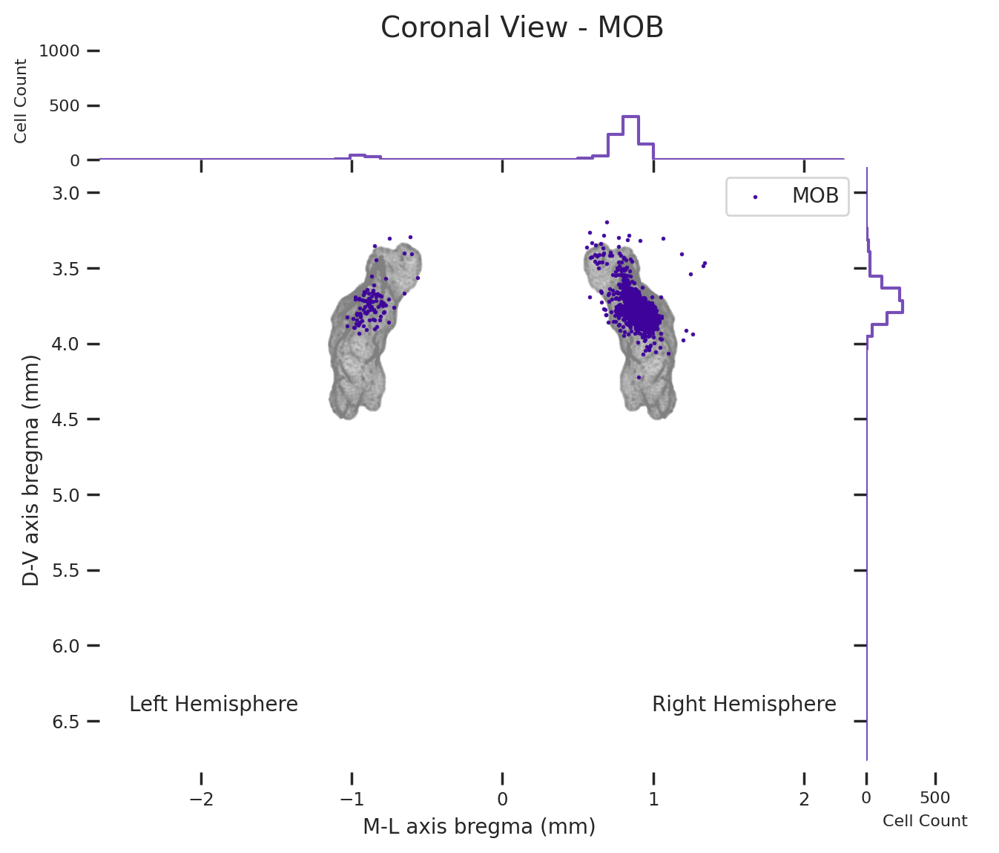

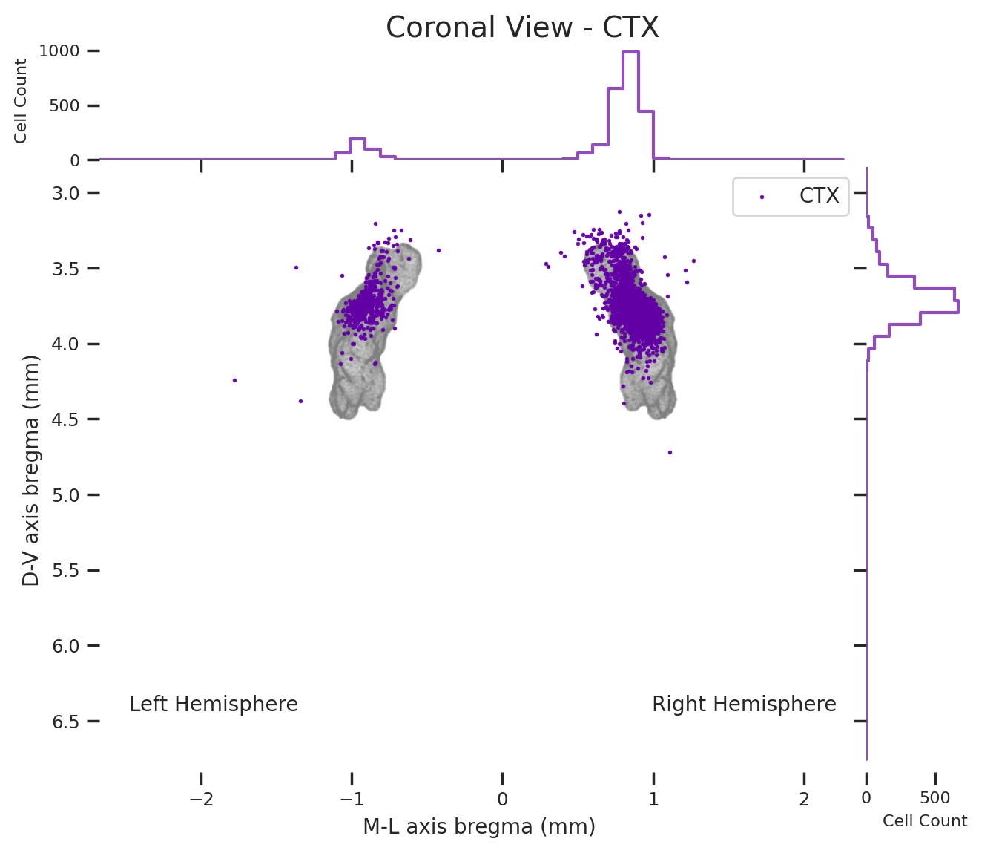

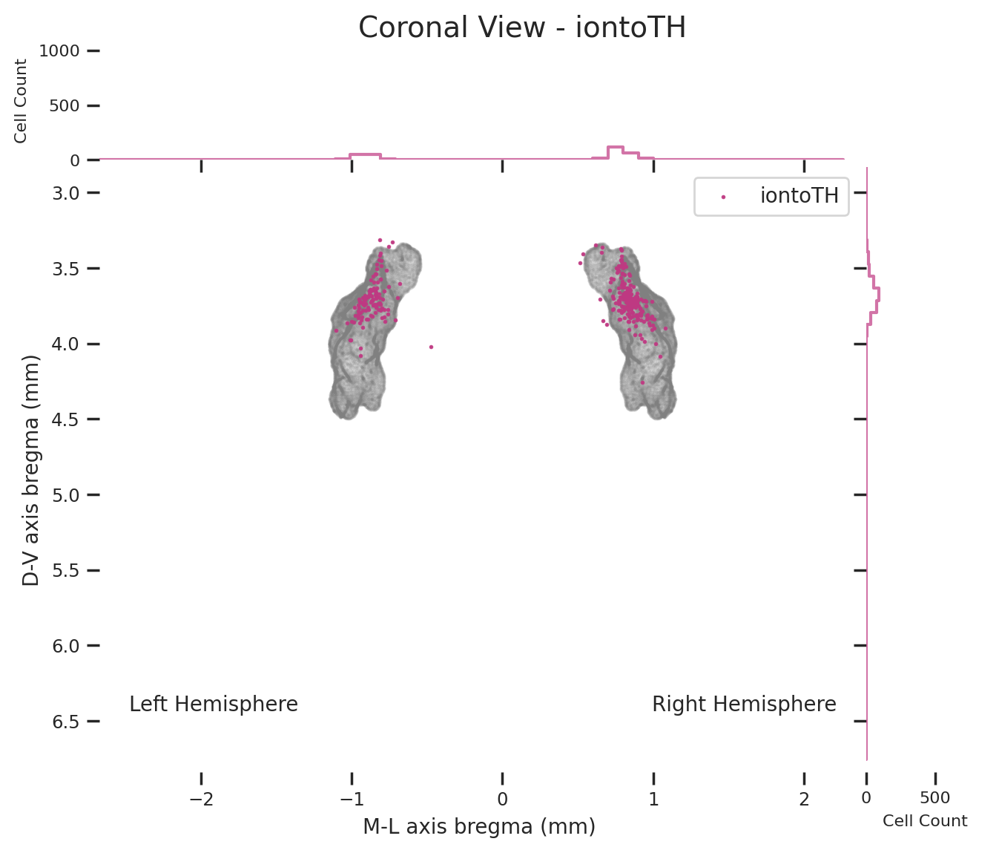

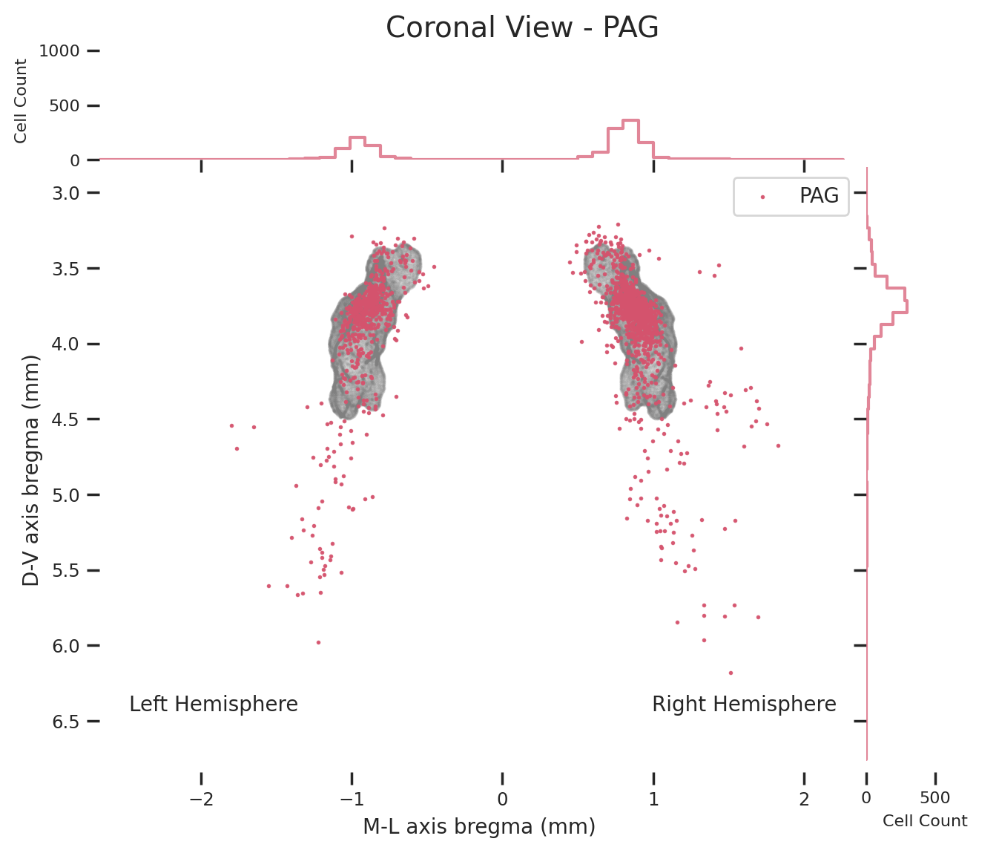

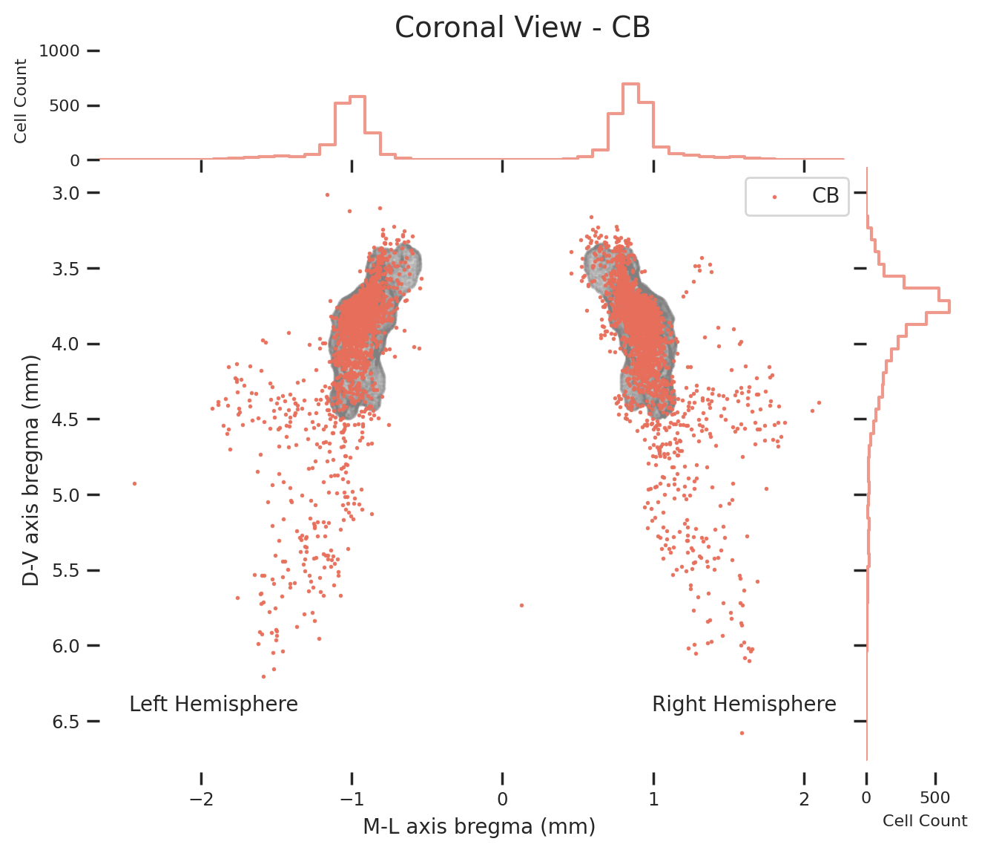

...

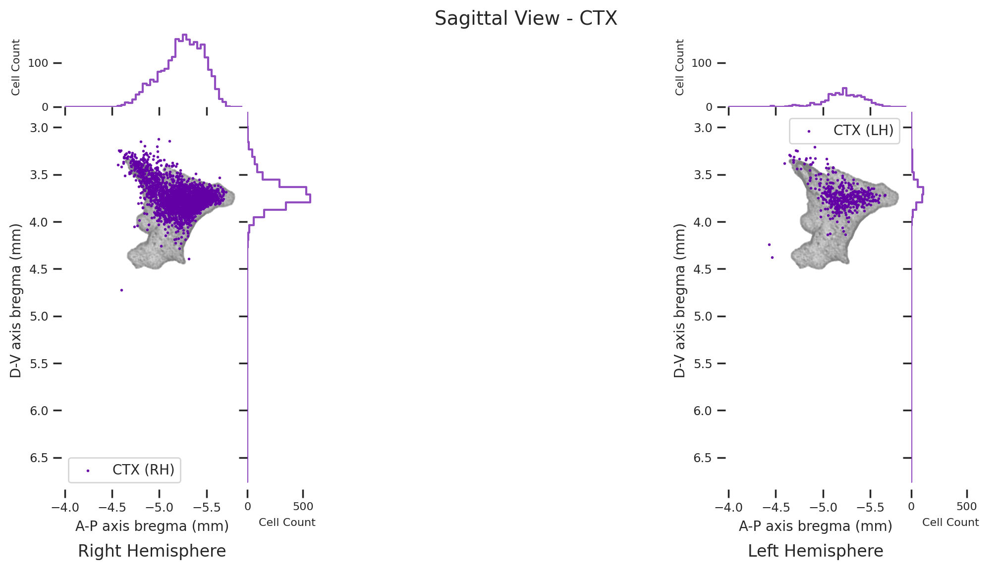

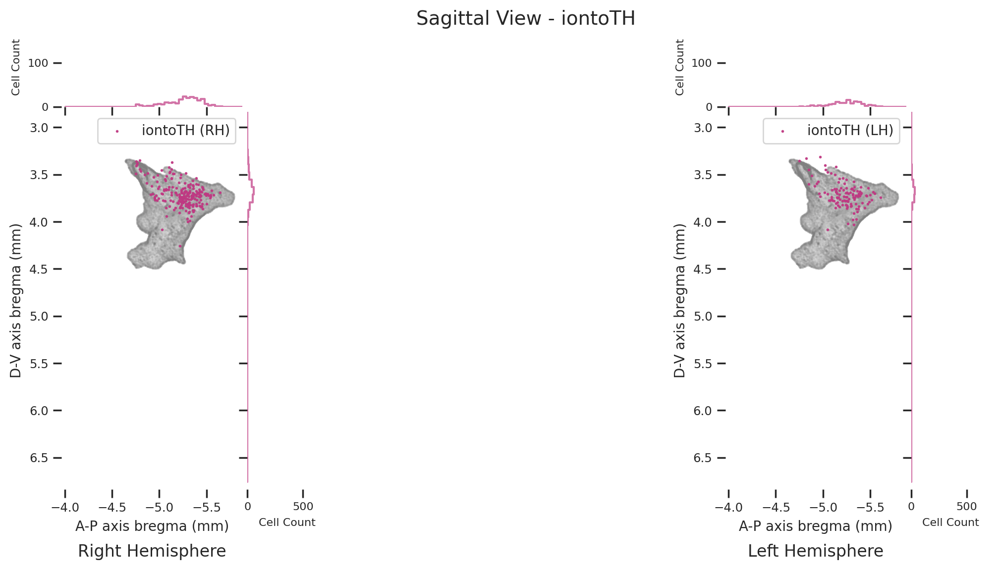

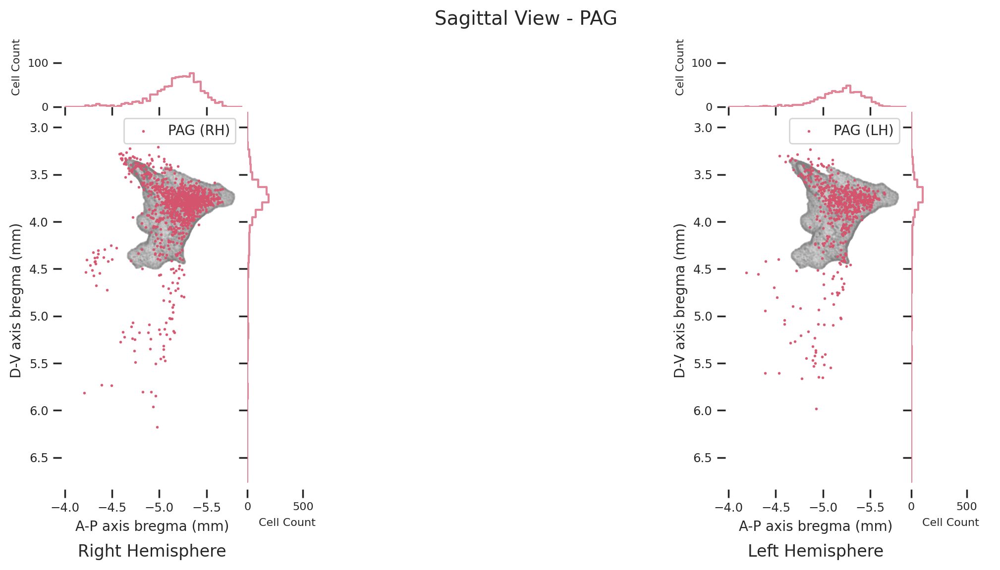

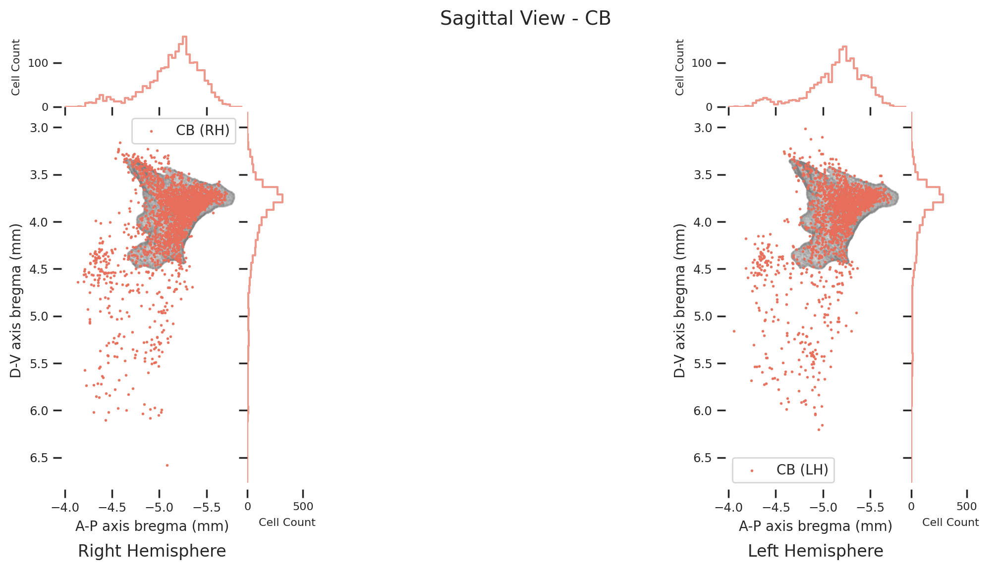

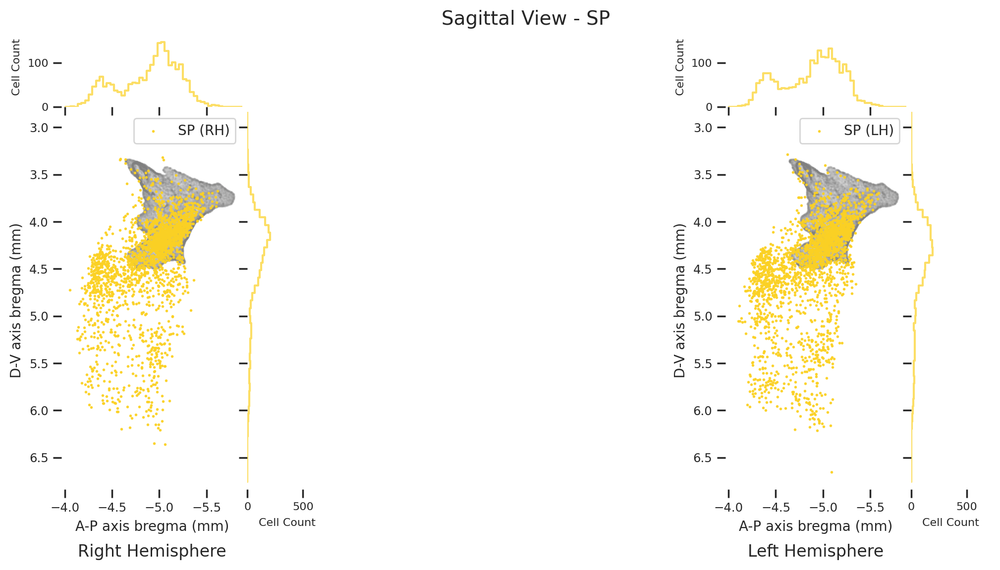

In [ ]:
all_regions = list(region_col_map.keys())
mm_coords = {'x': mm_x, 'y': mm_y, 'z': mm_z}
limits = {'ml': ml_lim, 'dv': dv_lim, 'ap': ap_lim}

# Create coronal plots
create_individual_plots('coronal', all_regions, region_col_map, retro_cells, 
                       mm_coords, mesh_vertices_bregma_mm, limits, dot_size, mesh_alpha)

# Create sagittal plots  
create_individual_plots('sagittal', all_regions, region_col_map, retro_cells,
                       mm_coords, mesh_vertices_bregma_mm, limits, dot_size, mesh_alpha)

In [ ]:
def create_individual_plots(view_type, regions, region_col_map, retro_cells, mm_coords, mesh_vertices, limits, dot_size, mesh_alpha):
    """
    Create individual plots for coronal or sagittal views with consistent proportions.
    Mesh is rendered as bitmap for file size management.
    """
    
    # Helper function to create bitmap mesh (adapted from your sagittal code)
    def create_mesh_bitmap(mesh_x, mesh_y, x_lim, y_lim, resolution=500, alpha=mesh_alpha):
        """Create a bitmap representation of the mesh"""
        from scipy.ndimage import gaussian_filter
        hist, x_edges, y_edges = np.histogram2d(
            mesh_x, mesh_y,
            bins=resolution,
            range=[x_lim, y_lim]
        )
        # Gaussian smoothing for antialiased, soft mesh edges
        binary_mask = (hist > 0).astype(float)
        alpha_channel = gaussian_filter(binary_mask, sigma=0.8)
        alpha_channel = np.clip(alpha_channel, 0, 1)
        bitmap = np.zeros((resolution, resolution, 4))
        bitmap[:, :, :3] = 0.35  # Gray RGB (darker)
        bitmap[:, :, 3] = alpha_channel.T * alpha
        return bitmap, [x_lim[0], x_lim[1], y_lim[0], y_lim[1]]
    
    # Set up coordinates and labels based on view type
    if view_type == 'coronal':
        x_coords, y_coords = mm_coords['y'], mm_coords['z']  # ML, DV
        x_lim, y_lim = limits['ml'], limits['dv']
        x_label, y_label = 'M-L axis bregma (mm)', 'D-V axis bregma (mm)'
        mesh_x, mesh_y = mesh_vertices[:, 2], mesh_vertices[:, 1]
        # For coronal, create bitmaps for original and mirrored mesh
        mesh_bitmap_orig, mesh_extent_orig = create_mesh_bitmap(mesh_x, mesh_y, x_lim, y_lim)
        mesh_vertices_mirror = mesh_vertices.copy()
        mesh_vertices_mirror[:, 2] *= -1
        mesh_bitmap_mirr, mesh_extent_mirr = create_mesh_bitmap(mesh_vertices_mirror[:, 2], mesh_vertices_mirror[:, 1], x_lim, y_lim)
        hemispheres = [None]  # Single plot
        fig_title_prefix = 'Coronal View'
        filename_suffix = ''
    else:  # sagittal
        x_coords, y_coords = mm_coords['x'], mm_coords['z']  # AP, DV  
        x_lim, y_lim = limits['ap'], limits['dv']
        x_label, y_label = 'A-P axis bregma (mm)', 'D-V axis bregma (mm)'
        mesh_x, mesh_y = mesh_vertices[:, 0], mesh_vertices[:, 1]
        # For sagittal, create bitmaps for RH and LH
        mesh_bitmap_rh, mesh_extent_rh = create_mesh_bitmap(mesh_x, mesh_y, x_lim, y_lim)
        mesh_vertices_mirror = mesh_vertices.copy()
        mesh_vertices_mirror[:, 2] *= -1
        mesh_bitmap_lh, mesh_extent_lh = create_mesh_bitmap(mesh_vertices_mirror[:, 0], mesh_vertices_mirror[:, 1], x_lim, y_lim)
        hemispheres = ['RH', 'LH']  # Two subplots
        fig_title_prefix = 'Sagittal View'
        filename_suffix = '_RH_LH'
    
    # Calculate global histogram bins and limits (unchanged)
    bins_x = np.histogram_bin_edges(x_coords, bins=50, range=x_lim)
    bins_y = np.histogram_bin_edges(y_coords, bins=50, range=y_lim)
    
    max_count_x = max_count_y = 0
    for region in regions:
        for hemi in (['RH', 'LH'] if view_type == 'sagittal' else [None]):
            if hemi:
                hemi_mask = mm_coords['y'] >= 0 if hemi == 'RH' else mm_coords['y'] < 0
                mask = (retro_cells["injection_region"] == region) & hemi_mask
            else:
                mask = retro_cells["injection_region"] == region
                
            if mask.any():
                hist_x, _ = np.histogram(x_coords[mask], bins=bins_x)
                hist_y, _ = np.histogram(y_coords[mask], bins=bins_y)
                max_count_x = max(max_count_x, hist_x.max())
                max_count_y = max(max_count_y, hist_y.max())
    
    max_count_x *= 1.1
    max_count_y *= 1.1
    
    # Figure size (unchanged)
    if view_type == 'coronal':
        fig_size = (8, 6)
    else:  
        fig_size = (16, 6)
    
    # Create plots for each region
    for region in regions:
        fig = plt.figure(figsize=fig_size)
        
        for i, hemi in enumerate(hemispheres):
            ax_main = plt.subplot2grid((1, len(hemispheres)), (0, i), fig=fig) if len(hemispheres) > 1 else plt.subplot(1, 1, 1)
            ax_main.set_aspect("equal", adjustable="box")
            
            # Create histograms (unchanged)
            divider = make_axes_locatable(ax_main)
            ax_x_hist = divider.append_axes("top", size=0.8, pad=0.05, sharex=ax_main)
            ax_y_hist = divider.append_axes("right", size=0.8, pad=0.05, sharey=ax_main)
            plt.setp(ax_x_hist.get_xticklabels(), visible=False)
            plt.setp(ax_y_hist.get_yticklabels(), visible=False)
            
            # REPLACE scatter with imshow for bitmap mesh
            if view_type == 'sagittal':
                if hemi == 'LH':
                    ax_main.imshow(mesh_bitmap_lh, extent=mesh_extent_lh, origin='lower', aspect='equal', interpolation='nearest')
                else:  # RH
                    ax_main.imshow(mesh_bitmap_rh, extent=mesh_extent_rh, origin='lower', aspect='equal', interpolation='nearest')
            else:  # coronal
                ax_main.imshow(mesh_bitmap_orig, extent=mesh_extent_orig, origin='lower', aspect='equal', interpolation='nearest')
                ax_main.imshow(mesh_bitmap_mirr, extent=mesh_extent_mirr, origin='lower', aspect='equal', interpolation='nearest')
            
            # Plot cells (unchanged)
            if hemi:
                hemi_mask = mm_coords['y'] >= 0 if hemi == 'RH' else mm_coords['y'] < 0
                mask = (retro_cells["injection_region"] == region) & hemi_mask
                label = f'{region} ({hemi})'
            else:
                mask = retro_cells["injection_region"] == region
                label = region
            
            if mask.any():
                ax_main.scatter(x_coords[mask], y_coords[mask], c=region_col_map[region], 
                               s=1, alpha=0.9, label=label)
                ax_main.legend(loc="best", fontsize=10)
                
                # Histograms (unchanged)
                if len(x_coords[mask]) > 5:
                    hist_x, _ = np.histogram(x_coords[mask], bins=bins_x)
                    ax_x_hist.step(bins_x[:-1], hist_x, where="mid", color=region_col_map[region], alpha=0.7)
                    ax_x_hist.set_ylim(0, max_count_x)
                
                if len(y_coords[mask]) > 5:
                    hist_y, _ = np.histogram(y_coords[mask], bins=bins_y)
                    ax_y_hist.step(hist_y, bins_y[:-1], where="mid", color=region_col_map[region], alpha=0.7)
                    ax_y_hist.set_xlim(0, max_count_y)
            
            # Format axes (unchanged)
            ax_main.set_xlim(x_lim)
            ax_main.set_ylim(y_lim)
            ax_main.set_xlabel(x_label, fontsize=10)
            ax_main.set_ylabel(y_label, fontsize=10)
            ax_main.invert_yaxis()
            if view_type == 'sagittal':
                ax_main.invert_xaxis()
            ax_main.set_frame_on(False)
            
            # Add titles and labels (unchanged)
            if view_type == 'coronal':
                label_y = y_lim[0] + 0.9 * (y_lim[1] - y_lim[0])
                left_x = x_lim[0] + 0.15 * (x_lim[1] - x_lim[0])
                right_x = x_lim[1] - 0.15 * (x_lim[1] - x_lim[0])
                ax_main.text(left_x, label_y, 'Left Hemisphere', fontsize=10, ha='center')
                ax_main.text(right_x, label_y, 'Right Hemisphere', fontsize=10, ha='center')
            else:
                ax_main.set_title(f"{'Right' if hemi == 'RH' else 'Left'} Hemisphere", fontsize=12, y=-0.20)
            
            # Format histogram axes (unchanged)
            for hist_ax in [ax_x_hist, ax_y_hist]:
                hist_ax.set_frame_on(False)
                hist_ax.tick_params(labelsize=8)
            ax_x_hist.set_ylabel("Cell Count", fontsize=8)
            ax_y_hist.set_xlabel("Cell Count", fontsize=8)
        
        fig.suptitle(f'{fig_title_prefix} - {region}', fontsize=14, y=0.95)
        plt.tight_layout()
        
        # Save (unchanged - still PDF and SVG, but now with bitmap mesh inside)
        clean_name = "".join(c for c in region if c.isalnum() or c in (' ', '-', '_')).rstrip().replace(' ', '_')
        base_path = f'/results/plots/individual_retro_bitmap_mesh_{view_type.lower()}_{clean_name}{filename_suffix}'
        plt.savefig(f'{base_path}.pdf', format='pdf', dpi=300, bbox_inches='tight')
        plt.savefig(f'{base_path}.svg', format='svg', bbox_inches='tight')
        plt.show()
        plt.close(fig)

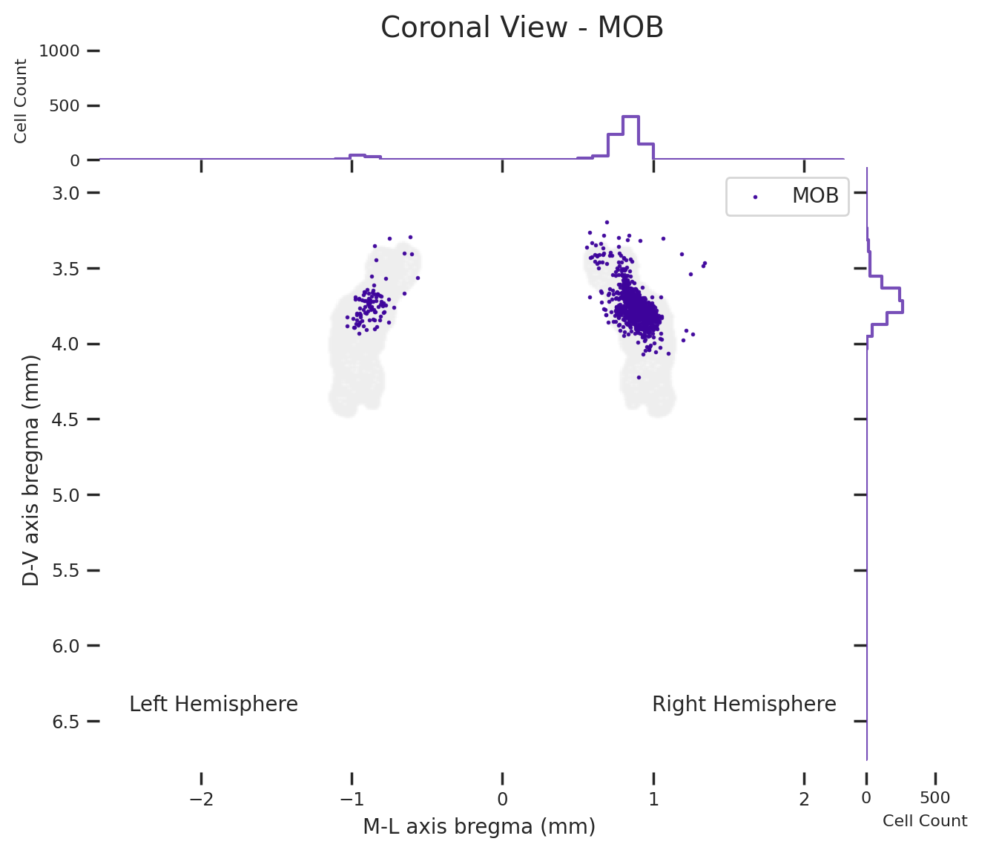

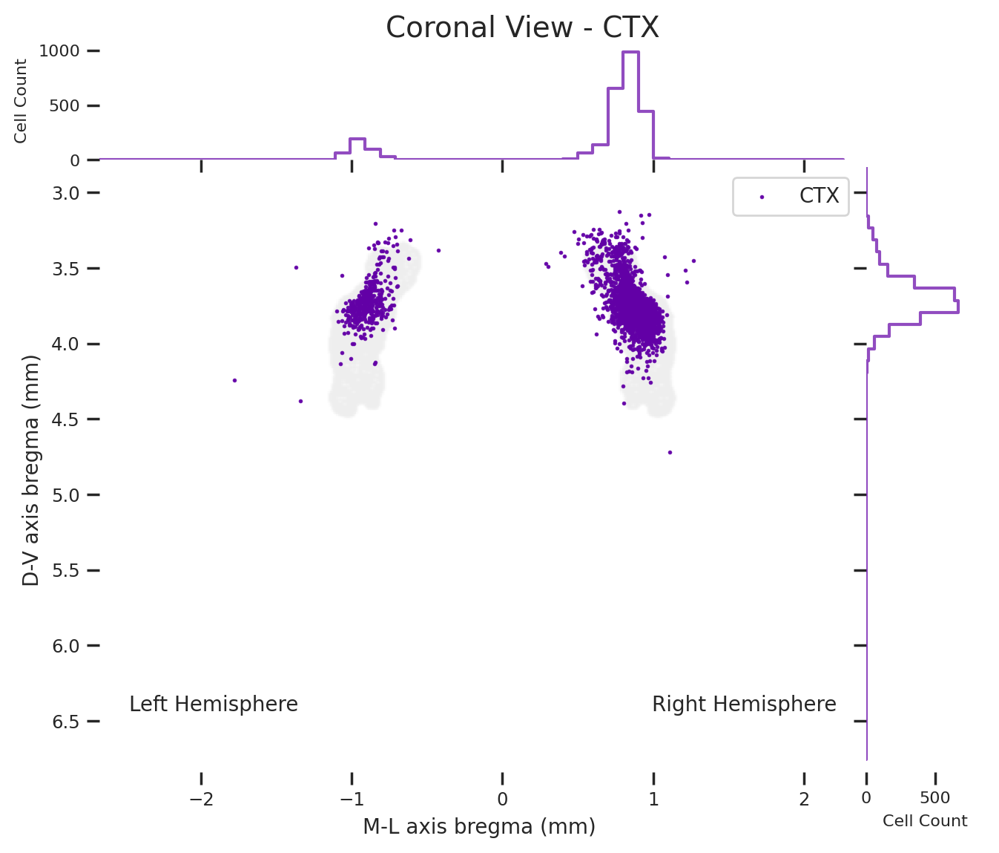

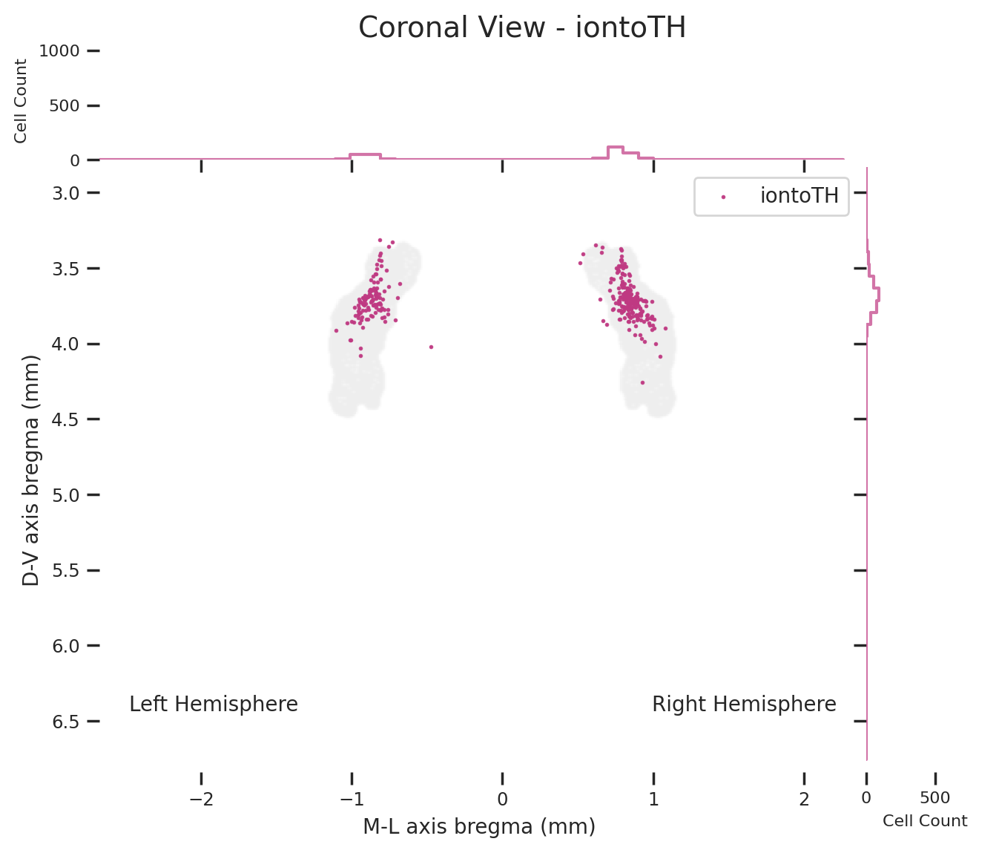

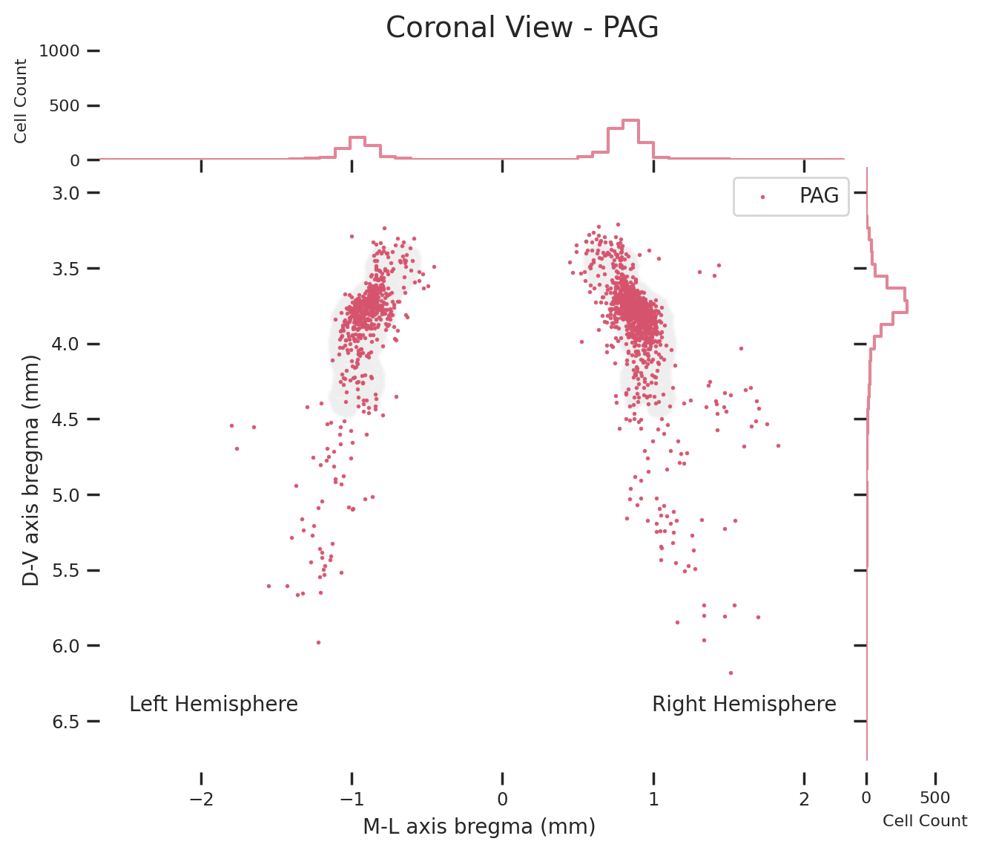

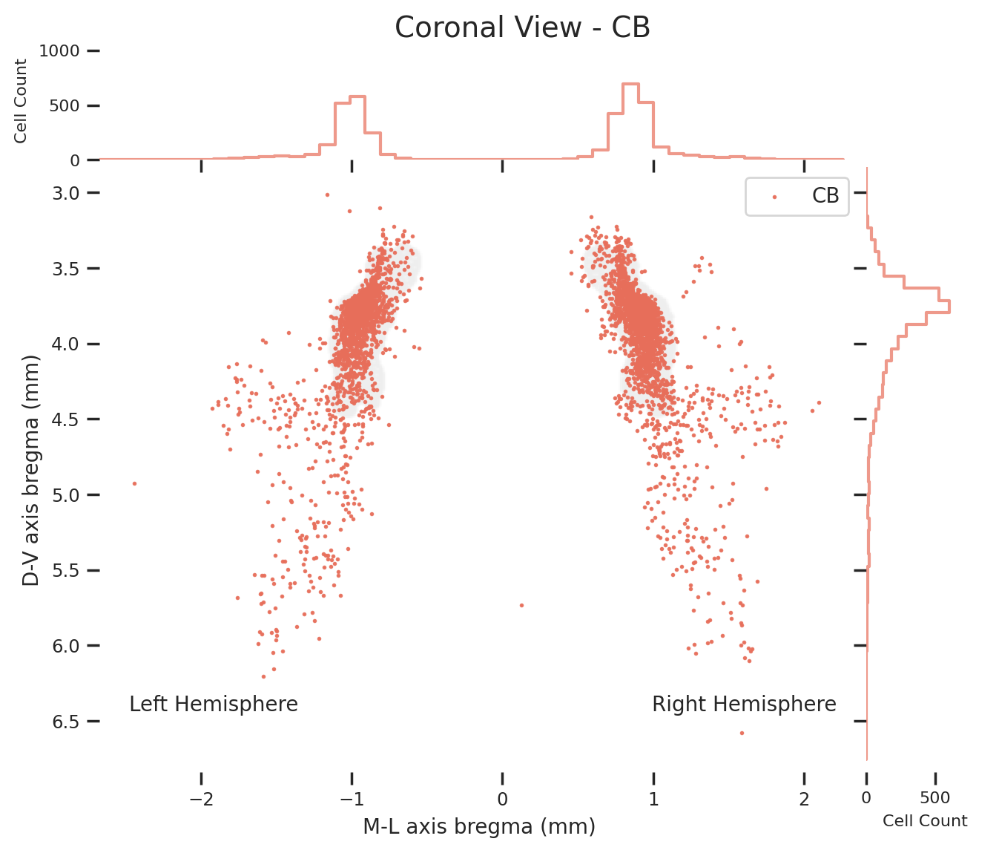

...

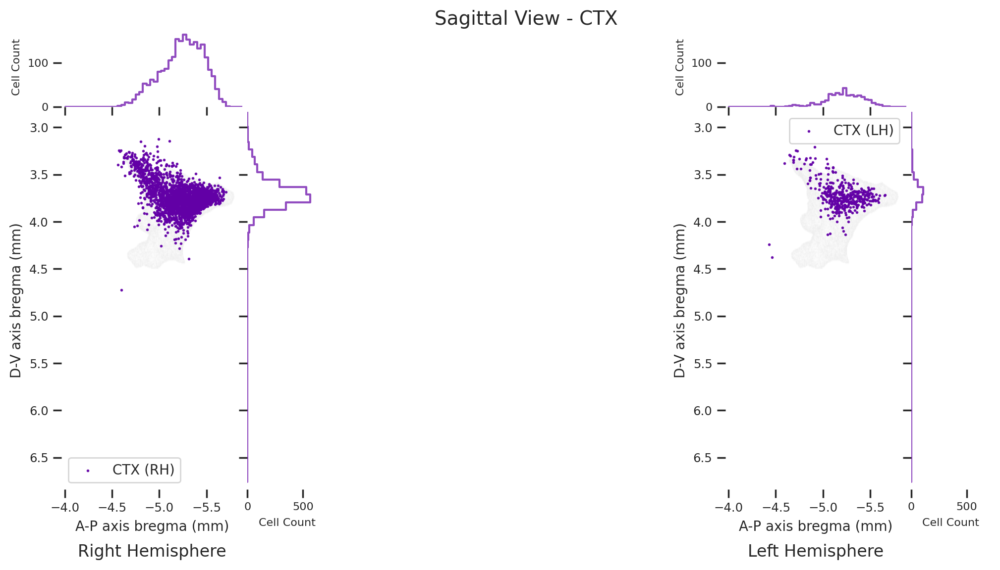

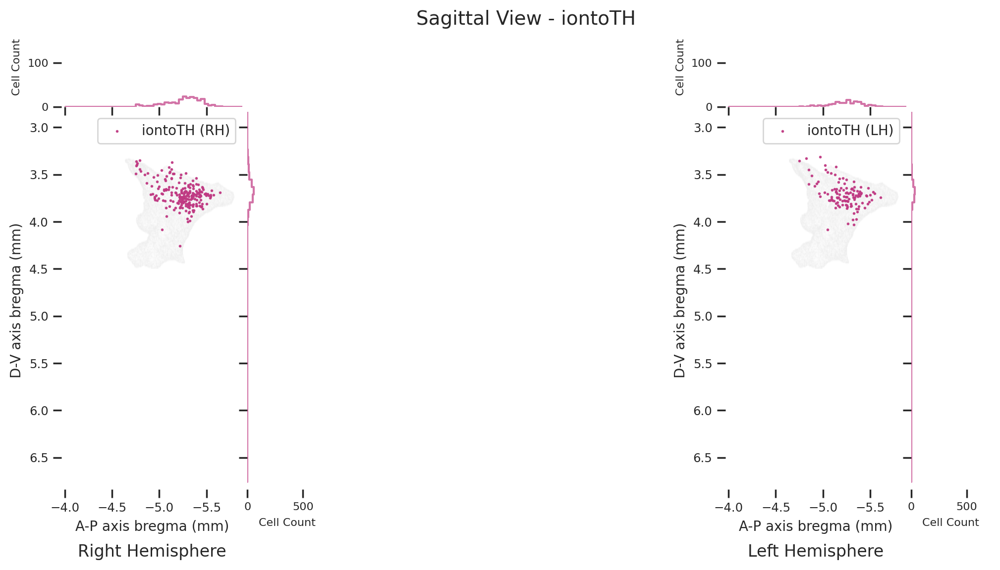

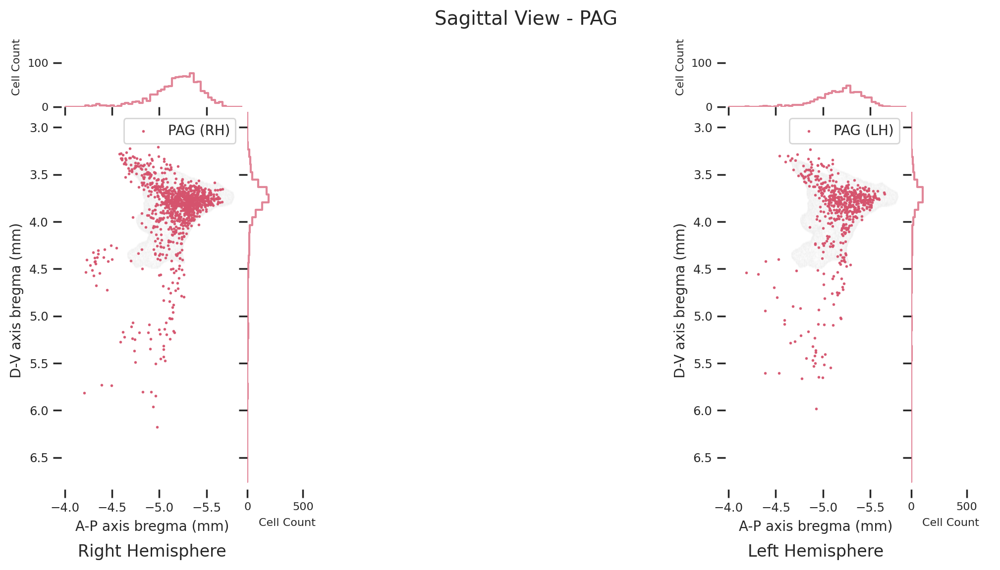

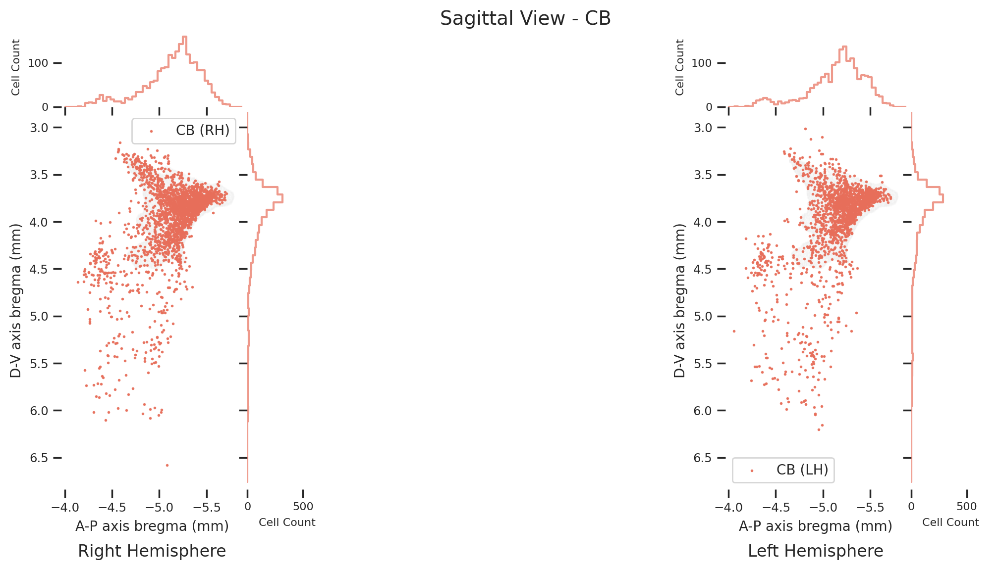

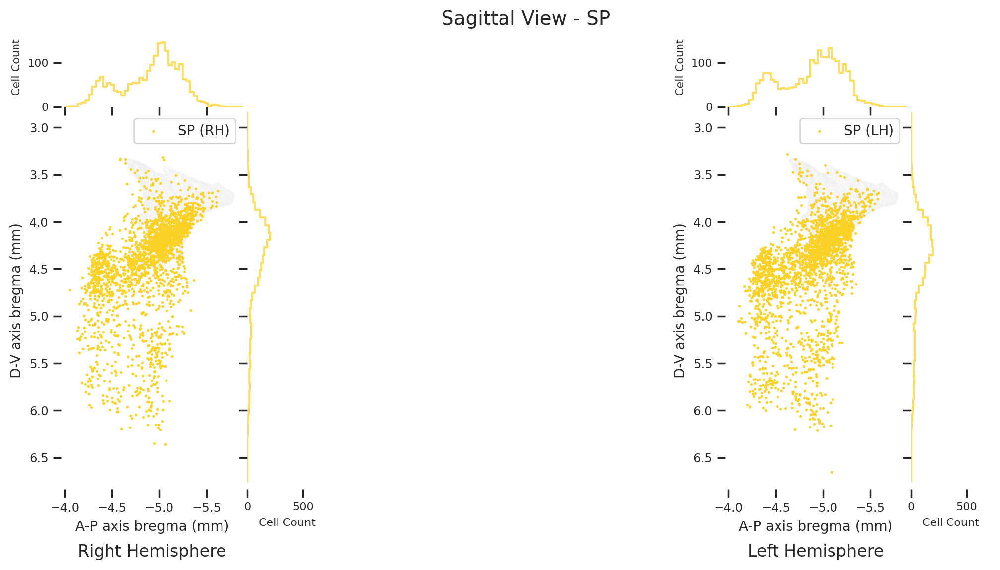

In [ ]:
all_regions = list(region_col_map.keys())
mm_coords = {'x': mm_x, 'y': mm_y, 'z': mm_z}
limits = {'ml': ml_lim, 'dv': dv_lim, 'ap': ap_lim}

# Create coronal plots
create_individual_plots('coronal', all_regions, region_col_map, retro_cells, 
                       mm_coords, mesh_vertices_bregma_mm, limits, dot_size, mesh_alpha)

# Create sagittal plots  
create_individual_plots('sagittal', all_regions, region_col_map, retro_cells,
                       mm_coords, mesh_vertices_bregma_mm, limits, dot_size, mesh_alpha)